<a href="https://colab.research.google.com/github/PaoloMadda01/Projects-with-Google-Colab/blob/main/FaceRecognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.8/677.8 kB 9.2 MB/s eta 0:00:00


In [ ]:
import cv2
import tensorflow as tf
from google.colab import files
from google.colab.patches import cv2_imshow
import numpy as np
from ultralytics import YOLO
import time

ModuleNotFoundError: No module named 'ultralytics'

# bbox Yolo

In [ ]:
# Carica l'immagine dal tuo computer
uploaded = files.upload()
image_path = list(uploaded.keys())[0]


Saving test4.png to test4.png


In [ ]:
image = cv2.imread(image_path)

In [ ]:
uploaded = files.upload()
model = tf.keras.models.load_model('keras_model.h5')

Saving keras_model.h5 to keras_model.h5


In [ ]:
def load_yolo_model():
    # Carica il modello YOLO con pesi pre-addestrati
    model = YOLO('yolov8n.pt')
    return model

# Carica il modello YOLOv8n
yolo_model = load_yolo_model()

In [ ]:
# Cerca la persona e crea la bbox di essa
def detect_all_people(image, model):
    image_rgb = image[:, :, ::-1]
    bbox = None
    person_bboxes = []

    # Utilizza il modello YOLOv8 per rilevare oggetti nell'immagine
    results = model(image_rgb)
    if len(results) > 0:
        for result in results:
            boxes = result.boxes.cpu().numpy()
            for box in boxes:
                # Aumenta la soglia di confidenza a 0.8
                if box.conf[0] > 0.8 and box.cls[0] == 0:
                    r = box.xyxy[0].astype(int)
                    bbox = (r[0], r[1], r[2]-800, r[3]-200)
                    person_bboxes.append(bbox)
                    print("Predicted!")
    if bbox is None:
        print("No person detected")

    return person_bboxes


def classify_person(classification_model, image, people_boxes):
    for box in people_boxes:
        x, y, w, h = box
        person_crop = image[y:y+h, x:x+w]
        person_crop = cv2.resize(person_crop, (224, 224))  # Adatta a dimensioni modello
        person_crop = tf.convert_to_tensor(person_crop)
        person_crop = tf.expand_dims(person_crop, 0)

        prediction = classification_model.predict(person_crop)
        class_1_probability = prediction[0][0]
        class_2_probability = prediction[0][1]

        print(class_1_probability)

        if class_1_probability < class_2_probability:
            # Disegna il bounding box per la persona specifica
            cv2.rectangle(image, (x, y), (x+w, y+h), (255, 0, 0), 2)

    return image

In [ ]:
image = cv2.imread(image_path)          # Da togliere


0: 320x640 11 persons, 1 bottle, 115.9ms
Speed: 27.8ms preprocess, 115.9ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 640)
Predicted!
1/1 [==============================] - 0s 39ms/step
0.0030222982


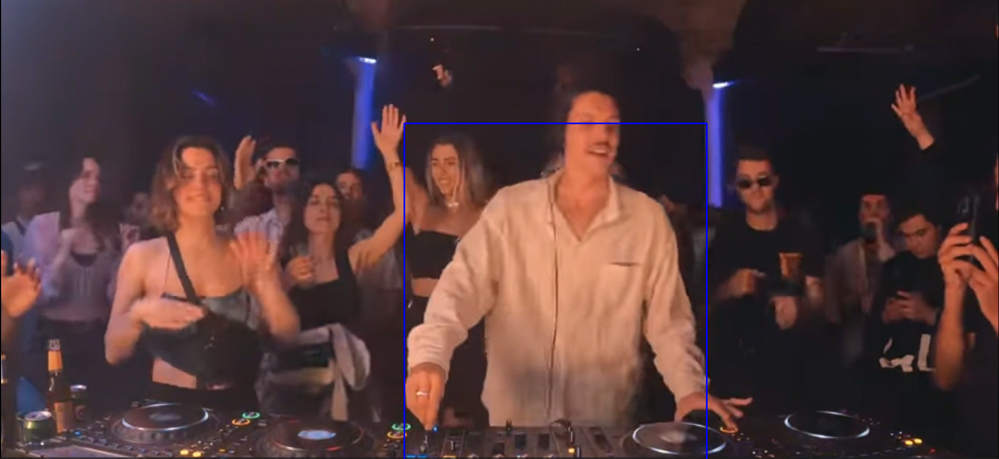

In [ ]:
people_boxes = detect_all_people(image, yolo_model)
output_image = classify_person(model, image, people_boxes)

# Visualizza l'immagine risultante
cv2_imshow(output_image)

# Segmentazione

In [ ]:
import torch
from torchvision import models
from torchvision.transforms import functional as F
from PIL import Image
import torchvision.transforms as T
import numpy as np
from google.colab import files
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Carica il modello pre-addestrato
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model = model.to(device)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth
100%|██████████| 233M/233M [00:02<00:00, 113MB/s]


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [ ]:
def prepare_image(image, input_size=(520, 520)):
    # Carica l'immagine utilizzando PIL
    image = Image.fromarray(image.astype('uint8'), 'RGB')

    # Definisci le trasformazioni necessarie
    transform = T.Compose([
        T.Resize(input_size),          # Ridimensiona l'immagine
        T.ToTensor(),                  # Converti l'immagine in un tensore PyTorch
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizza con i valori di ImageNet
    ])

    # Applica le trasformazioni
    image = transform(image).unsqueeze(0)  # Aggiunge una dimensione batch

    return image

def predict(model, image_tensor):
    # Assicurati che il modello sia in modalità valutazione
    model.eval()

    # Passa l'immagine attraverso il modello
    with torch.no_grad():
        # Assicurati che il tensore sia sul dispositivo giusto
        image_tensor = image_tensor.to(device)

        # Ottieni il risultato dal modello
        output = model(image_tensor)['out']

        # Converti l'output in una mappa di segmentazione
        output_predictions = output.argmax(1)[0].cpu().numpy()  # Sposta il tensore sul CPU e convertilo in un array NumPy

    return output_predictions

In [ ]:
# Carica l'immagine dal tuo computer
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

Saving test1.png to test1.png


In [ ]:
uploaded = files.upload()
my_model = tf.keras.models.load_model('keras_model.h5')

Saving keras_model.h5 to keras_model (2).h5


In [ ]:
image = cv2.imread(image_path)

Tempo impiegato: 0.226 secondi


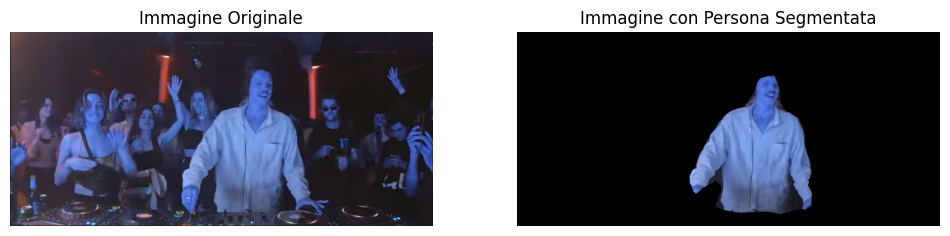

In [ ]:
import matplotlib.pyplot as plt
import time

# Assumendo che `output_predictions` sia la mappa di segmentazione ottenuta dal modello
person_class_id = 15  # Assumendo che 15 sia l'ID per la classe 'persona'

# Inizia il cronometraggio
start_time = time.time()

# Prepara l'immagine e ottieni la maschera
image_before = prepare_image(image)
person_mask = (predict(model, image_before) == person_class_id)

# Calcola e stampa il tempo impiegato
elapsed_time = time.time() - start_time
print(f"Tempo impiegato: {elapsed_time:.3f} secondi")

# Assicurati che 'image' sia un oggetto PIL.Image per ottenere le sue dimensioni
if isinstance(image, np.ndarray):
    image = Image.fromarray(image)

# Ridimensiona la maschera alla dimensione originale dell'immagine
person_mask_resized = Image.fromarray(person_mask.astype(np.uint8) * 255)
person_mask_resized = person_mask_resized.resize(image.size, Image.NEAREST)

# Converti la maschera ridimensionata in un array NumPy
person_mask_resized_np = np.array(person_mask_resized)

# Visualizza l'immagine originale e la maschera
plt.figure(figsize=(12, 6))

# Immagine originale
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Immagine Originale")
plt.axis('off')

# Immagine con maschera sovrapposta
plt.subplot(1, 2, 2)
masked_image = np.copy(np.array(image))
masked_image[person_mask_resized_np == 0] = 0  # Sovrappone la maschera
plt.imshow(masked_image)
plt.title("Immagine con Persona Segmentata")
plt.axis('off')

plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# MTCNN

In [ ]:
!pip install facenet-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 10.2 MB/s eta 0:00:00


In [ ]:
from facenet_pytorch import MTCNN
import torch
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import numpy as np
from tensorflow.keras.preprocessing import image as keras_image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Carica il modello MTCNN
mtcnn = MTCNN(keep_all=True, device=device)

In [ ]:
import time

In [ ]:
# Carica l'immagine dal tuo computer
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

Saving test4.png to test4.png


In [ ]:
image = cv2.imread(image_path)

In [ ]:

# Funzione per trovare i volti in un'immagine
def find_faces(image):
    boxes, _ = mtcnn.detect(image)

    return boxes


Tempo impiegato: 1.684 secondi


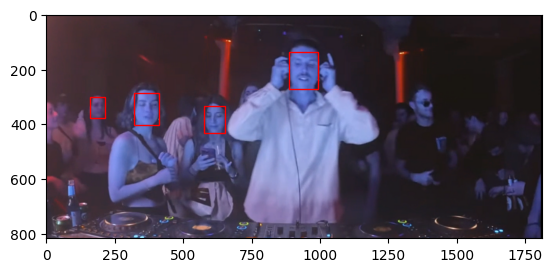

In [ ]:
start_time = time.time()

boxes = find_faces(image)

elapsed_time = time.time() - start_time
print(f"Tempo impiegato: {elapsed_time:.3f} secondi")


# Visualizza l'immagine e i bounding box dei volti
plt.imshow(image)
ax = plt.gca()

if boxes is not None:
    for box in boxes:
        rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], fill=False, color='red')
        ax.add_patch(rect)

plt.show()

In [ ]:
# se caricato dai file nella colonna di sinistra
from tensorflow.keras.models import load_model
# Specificare il percorso corretto al file
model_path = '/content/keras_model.h5'
# Caricare il modello da best_model.h5
my_model = load_model(model_path)


In [ ]:
uploaded = files.upload()
my_model = tf.keras.models.load_model('keras_model.h5')

KeyboardInterrupt: 

In [ ]:
def predict_with_model(model, image_np, box):
    if isinstance(image_np, np.ndarray):
        image = Image.fromarray(image_np)
    else:
        image = image_np

    face = image.crop(box)
    face = face.resize((224, 224))  # Assumendo che il tuo modello richieda questa dimensione di input
    face_arr = keras_image.img_to_array(face)
    face_arr = np.expand_dims(face_arr, axis=0)
    face_arr = tf.keras.applications.mobilenet_v2.preprocess_input(face_arr)  # Sostituisci con la pre-elaborazione richiesta dal tuo modello

    prediction = model.predict(face_arr)
    return prediction

In [ ]:
# modello addestrato da me
from PIL import Image
import numpy as np
import cv2

def predict_with_model(model, image_np, box):
    if isinstance(image_np, np.ndarray):
        image = Image.fromarray(image_np)
    else:
        image = image_np

    # Ritaglia l'immagine e convertila in array NumPy
    face = image.crop(box)
    face_arr = np.array(face)

    # Ridimensiona l'array NumPy
    face_arr = cv2.resize(face_arr, (200, 200))
    face_arr = np.expand_dims(face_arr, axis=0)
    face_arr = tf.keras.applications.mobilenet_v2.preprocess_input(face_arr)

    prediction = model.predict(face_arr)
    return prediction


1/1 [==============================] - 0s 99ms/step
Predizione per il box [886.3009643554688 134.66351318359375 992.96044921875 271.31146240234375]: 0.0
1/1 [==============================] - 0s 48ms/step
Predizione per il box [321.61480712890625 287.49993896484375 410.347412109375 401.39324951171875]: 0.0
1/1 [==============================] - 0s 45ms/step
Predizione per il box [575.0809936523438 333.581787109375 653.4697875976562 432.8114929199219]: 0.0
1/1 [==============================] - 0s 47ms/step
Predizione per il box [158.75828552246094 301.5038146972656 215.63818359375 375.9508056640625]: 0.0
Tempo impiegato: 0.502 secondi


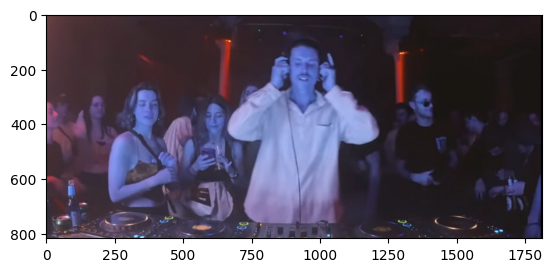

In [ ]:
start_time = time.time()

highest_prediction = 0
highest_pred_box = None
image_np = np.array(image)

for box in boxes:
    prediction = predict_with_model(my_model, image_np, box)

    # Estrarre il punteggio di confidenza massimo
    max_prediction = np.max(prediction)
    print(f"Predizione per il box {box}: {max_prediction}")

    if max_prediction > highest_prediction:
        highest_prediction = max_prediction
        highest_pred_box = box

elapsed_time = time.time() - start_time
print(f"Tempo impiegato: {elapsed_time:.3f} secondi")

if highest_pred_box is not None:
    print(f"Bbox con la predizione più alta: {highest_pred_box}, Predizione: {highest_prediction}")


# Visualizza l'immagine e il bounding box
plt.imshow(image)
ax = plt.gca()

if highest_pred_box is not None:
  rect = plt.Rectangle((highest_pred_box[0], highest_pred_box[1]), highest_pred_box[2]-highest_pred_box[0], highest_pred_box[3]-highest_pred_box[1], fill=False, color='red')
  ax.add_patch(rect)

plt.show()

# Dlib

In [ ]:
import dlib
from PIL import Image
import matplotlib.pyplot as plt

# Carica il detector di volti di Dlib
face_detector = dlib.get_frontal_face_detector()

# Funzione per trovare i volti in un'immagine
def find_faces_dlib(image):
    image_np = np.array(image)

    # Rileva i volti nell'immagine
    detected_faces = face_detector(image_np, 1)

    return detected_faces

In [ ]:
image = cv2.imread(image_path)

Tempo impiegato: 1.424 secondi


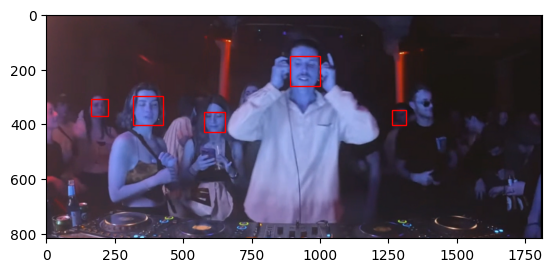

In [ ]:
start_time = time.time()

detected_faces = find_faces_dlib(image)

elapsed_time = time.time() - start_time
print(f"Tempo impiegato: {elapsed_time:.3f} secondi")

# Visualizza l'immagine e i bounding box dei volti
plt.imshow(image)
ax = plt.gca()

for face in detected_faces:
    left, top, right, bottom = face.left(), face.top(), face.right(), face.bottom()
    rect = plt.Rectangle((left, top), right - left, bottom - top, fill=False, color='red')
    ax.add_patch(rect)

plt.show()

In [ ]:
def predict_with_model(model, image_np, box):
    if isinstance(image_np, np.ndarray):
        image = Image.fromarray(image_np)
    else:
        image = image_np

    face = image.crop(box)
    face = face.resize((224, 224))  # Assumendo che il tuo modello richieda questa dimensione di input
    face_arr = keras_image.img_to_array(face)
    face_arr = np.expand_dims(face_arr, axis=0)
    face_arr = tf.keras.applications.mobilenet_v2.preprocess_input(face_arr)  # Sostituisci con la pre-elaborazione richiesta dal tuo modello

    prediction = model.predict(face_arr)
    return prediction

1/1 [==============================] - 0s 21ms/step
Tempo impiegato: 0.310 secondi
Bbox con la predizione più alta: [575.0809936523438 333.581787109375 653.4697875976562 432.8114929199219], Predizione: 0.9835514426231384


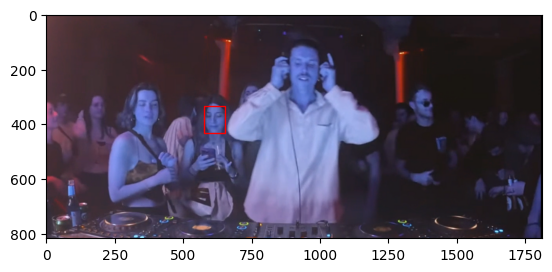

In [ ]:
start_time = time.time()

highest_prediction = 0
highest_pred_box = None
image_np = np.array(image)

for box in boxes:
    prediction = predict_with_model(my_model, image, box)

    # Estrarre il punteggio di confidenza massimo
    max_prediction = np.max(prediction)

    if max_prediction > highest_prediction:
        highest_prediction = max_prediction
        highest_pred_box = box

elapsed_time = time.time() - start_time
print(f"Tempo impiegato: {elapsed_time:.3f} secondi")

if highest_pred_box is not None:
    print(f"Bbox con la predizione più alta: {highest_pred_box}, Predizione: {highest_prediction}")


# Visualizza l'immagine e il bounding box
plt.imshow(image)
ax = plt.gca()

if highest_pred_box is not None:
  rect = plt.Rectangle((highest_pred_box[0], highest_pred_box[1]), highest_pred_box[2]-highest_pred_box[0], highest_pred_box[3]-highest_pred_box[1], fill=False, color='red')
  ax.add_patch(rect)

plt.show()

# OpenCV con Haar Cascades

In [ ]:
!pip install opencv-python-headless
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Carica il classificatore Haar Cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [ ]:
def find_faces_opencv(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Rileva i volti
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))


    return faces

In [ ]:
image = cv2.imread(image_path)

Tempo impiegato: 0.451 secondi


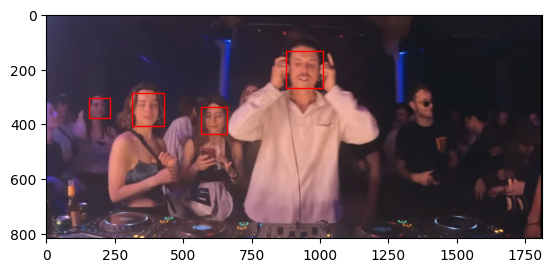

In [ ]:
start_time = time.time()

boxes = find_faces_opencv(image)

elapsed_time = time.time() - start_time
print(f"Tempo impiegato: {elapsed_time:.3f} secondi")


# Visualizza l'immagine e i bounding box dei volti
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax = plt.gca()

for (x, y, w, h) in boxes:
    rect = plt.Rectangle((x, y), w, h, fill=False, color='red')
    ax.add_patch(rect)

plt.show()

In [ ]:
def predict_with_model(model, image_np, box):
    if isinstance(image_np, np.ndarray):
        image = Image.fromarray(image_np)
    else:
        image = image_np

    # Reordina le coordinate se necessario
    left, top, right, bottom = box
    left, right = min(left, right), max(left, right)
    top, bottom = min(top, bottom), max(top, bottom)

    # Croppa l'immagine per ottenere solo il volto
    face = image.crop((left, top, right, bottom))
    face = face.resize((224, 224))  # Ridimensiona secondo le necessità del modello
    face_arr = keras_image.img_to_array(face)
    face_arr = np.expand_dims(face_arr, axis=0)
    face_arr = tf.keras.applications.mobilenet_v2.preprocess_input(face_arr)  # Sostituisci con la pre-elaborazione richiesta dal tuo modello

    prediction = model.predict(face_arr)
    return prediction

1/1 [==============================] - 0s 24ms/step
Tempo impiegato: 0.299 secondi
Bbox con la predizione più alta: [565 337  97  97], Predizione: 0.7094252109527588


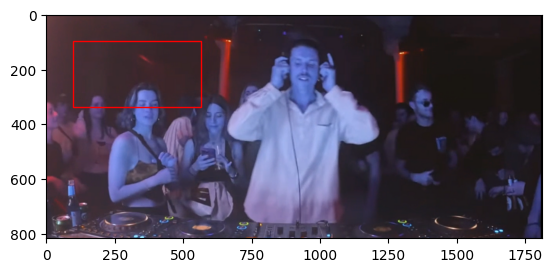

In [ ]:
start_time = time.time()

highest_prediction = 0
highest_pred_box = None
image_np = np.array(image)

for box in boxes:
    prediction = predict_with_model(my_model, image, box)

    # Estrarre il punteggio di confidenza massimo
    max_prediction = np.max(prediction)

    if max_prediction > highest_prediction:
        highest_prediction = max_prediction
        highest_pred_box = box

elapsed_time = time.time() - start_time
print(f"Tempo impiegato: {elapsed_time:.3f} secondi")

if highest_pred_box is not None:
    print(f"Bbox con la predizione più alta: {highest_pred_box}, Predizione: {highest_prediction}")


# Visualizza l'immagine e il bounding box
plt.imshow(image)
ax = plt.gca()

if highest_pred_box is not None:
  rect = plt.Rectangle((highest_pred_box[0], highest_pred_box[1]), highest_pred_box[2]-highest_pred_box[0], highest_pred_box[3]-highest_pred_box[1], fill=False, color='red')
  ax.add_patch(rect)

plt.show()


# Addestramento

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
!pip install mtcnn

import cv2
from mtcnn import MTCNN
import os

# Inizializza MTCNN
detector = MTCNN()

video_path = '/content/drive/MyDrive/Viso/viso2.mp4'  # Cambia con il nome del tuo video caricato
vidcap = cv2.VideoCapture(video_path)

success, image = vidcap.read()
count = 0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 15.8 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np

def adjust_brightness(image, alpha, beta):
    """ Modifica la luminosità dell'immagine. Alpha > 1 per renderla più chiara, < 1 per più scura. """
    return cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

def apply_blue_filter(image):
    """ Applica un filtro blu all'immagine. """
    blue_image = np.zeros_like(image)
    blue_image[:, :, 0] = image[:, :, 0]
    return blue_image

# Assumi che `detector` e `vidcap` siano già inizializzati
success, image = vidcap.read()
count = 0

while success:
    faces = detector.detect_faces(image)
    if len(faces) == 1:
        face = faces[0]
        x, y, width, height = face['box']
        face_image = image[y:y+height, x:x+width]

        if width > 20 and height > 20:
            # Salva il viso originale
            cv2.imwrite(f"/content/drive/MyDrive/Viso/Immagini2/frame{count}_original.jpg", face_image)

            # Applica e salva il filtro molto chiaro
            bright_image = adjust_brightness(face_image, alpha=1.5, beta=0)
            cv2.imwrite(f"/content/drive/MyDrive/Viso/Immagini2/frame{count}_bright.jpg", bright_image)

            # Applica e salva il filtro molto scuro
            dark_image = adjust_brightness(face_image, alpha=0.5, beta=0)
            cv2.imwrite(f"/content/drive/MyDrive/Viso/Immagini2/frame{count}_dark.jpg", dark_image)

            # Applica e salva il filtro blu
            blue_image = apply_blue_filter(face_image)
            cv2.imwrite(f"/content/drive/MyDrive/Viso/Immagini2/frame{count}_blue.jpg", blue_image)
    else:
        print("Due o più persone")

    success, image = vidcap.read()
    count += 1

print("Numero di frame: ", count)


NameError: name 'vidcap' is not defined

In [ ]:
import matplotlib.pyplot as plt
import random
from tensorflow.keras.callbacks import Callback
class PrintRandomImagesCallback(Callback):
    def __init__(self, dataset, num_samples=5):
        self.dataset = dataset
        self.num_samples = num_samples

    def on_epoch_end(self, epoch, logs=None):
        plt.figure(figsize=(10, 2))
        # Prendi un batch casuale di immagini e stampale
        for images, labels in self.dataset.unbatch().shuffle(1000).batch(self.num_samples).take(1):
            for i in range(self.num_samples):
                ax = plt.subplot(1, self.num_samples, i + 1)
                # Converti immagini in scala di grigi in RGB
                if images[i].shape[-1] == 1:
                    plt.imshow(images[i].numpy().squeeze(), cmap='gray')
                else:
                    # Assicurati che i valori siano nel range [0, 1] prima di visualizzare
                    plt.imshow(images[i].numpy())
                plt.title(int(labels[i].numpy()))
                plt.axis("off")
        plt.show()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout


# Definizione del modello
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Funzione per visualizzare un batch di immagini
def show_batch(image_batch, label_batch):
    plt.figure(figsize=(10,10))
    for n in range(25):
        ax = plt.subplot(5,5,n+1)
        plt.imshow(image_batch[n])
        plt.title(label_batch[n])
        plt.axis('off')
    plt.show()

Caricate 847 immagini.
Numero di frame in /content: 847
downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data
Olivetti Images Shape: (400, 64, 64, 3)
Numero di frame utilizzati per l'addestramento: 0
Dimensione totale del dataset combinato: 1247
Epoch 1/20
4/4 [==============================] - ETA: 0s - loss: 3.1376 - accuracy: 0.6189

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Finita l'epoca 1


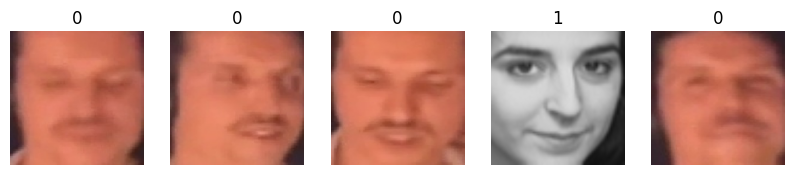

4/4 [==============================] - 25s 4s/step - loss: 3.1376 - accuracy: 0.6189 - val_loss: 0.0627 - val_accuracy: 0.9760
Epoch 2/20
4/4 [==============================] - ETA: 0s - loss: 0.3356 - accuracy: 0.8556Finita l'epoca 2


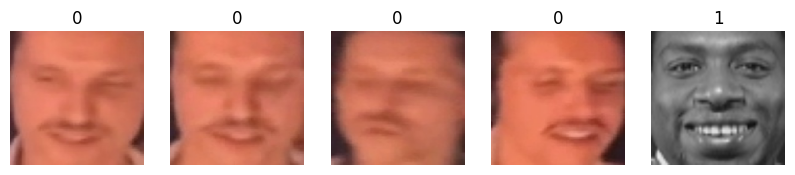

4/4 [==============================] - 4s 1s/step - loss: 0.3356 - accuracy: 0.8556 - val_loss: 0.0084 - val_accuracy: 1.0000
Epoch 3/20
4/4 [==============================] - ETA: 0s - loss: 0.0383 - accuracy: 0.9840Finita l'epoca 3


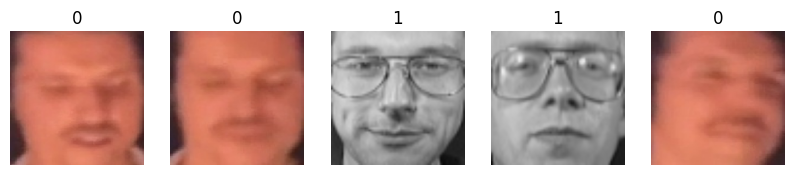

4/4 [==============================] - 3s 730ms/step - loss: 0.0383 - accuracy: 0.9840 - val_loss: 0.0865 - val_accuracy: 0.9440
Epoch 4/20
4/4 [==============================] - ETA: 0s - loss: 0.0421 - accuracy: 0.9779Finita l'epoca 4


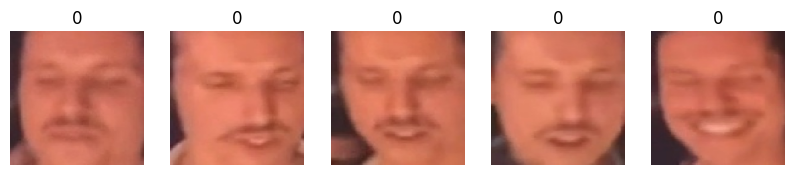

4/4 [==============================] - 3s 933ms/step - loss: 0.0421 - accuracy: 0.9779 - val_loss: 2.9330e-04 - val_accuracy: 1.0000
Epoch 5/20
4/4 [==============================] - ETA: 0s - loss: 2.7855e-04 - accuracy: 1.0000Finita l'epoca 5


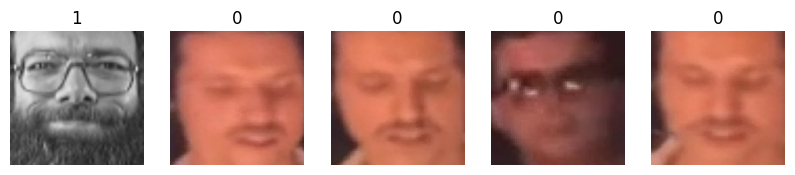

4/4 [==============================] - 4s 1s/step - loss: 2.7855e-04 - accuracy: 1.0000 - val_loss: 1.0861e-04 - val_accuracy: 1.0000
Epoch 6/20
4/4 [==============================] - ETA: 0s - loss: 8.3432e-04 - accuracy: 1.0000Finita l'epoca 6


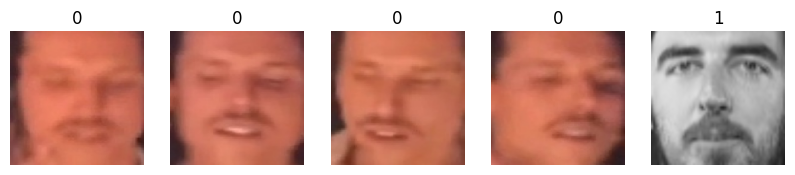

4/4 [==============================] - 5s 2s/step - loss: 8.3432e-04 - accuracy: 1.0000 - val_loss: 3.6640e-07 - val_accuracy: 1.0000
Epoch 7/20
4/4 [==============================] - ETA: 0s - loss: 3.6265e-07 - accuracy: 1.0000Finita l'epoca 7


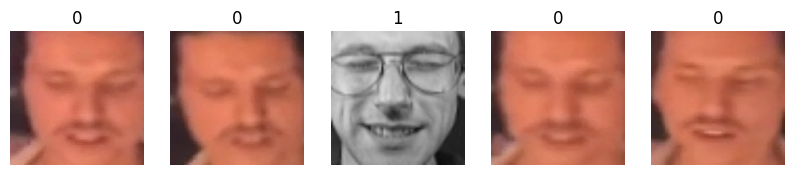

4/4 [==============================] - 4s 999ms/step - loss: 3.6265e-07 - accuracy: 1.0000 - val_loss: 7.5441e-11 - val_accuracy: 1.0000
Epoch 8/20
4/4 [==============================] - ETA: 0s - loss: 2.8504e-08 - accuracy: 1.0000Finita l'epoca 8


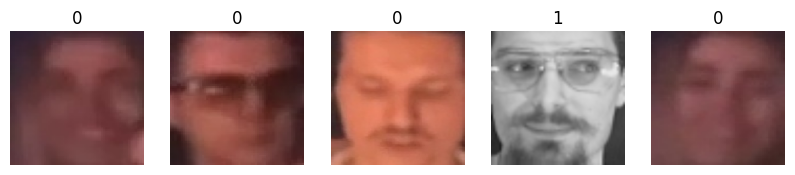

4/4 [==============================] - 4s 1s/step - loss: 2.8504e-08 - accuracy: 1.0000 - val_loss: 8.5766e-10 - val_accuracy: 1.0000
Epoch 9/20
4/4 [==============================] - ETA: 0s - loss: 1.0809e-06 - accuracy: 1.0000Finita l'epoca 9


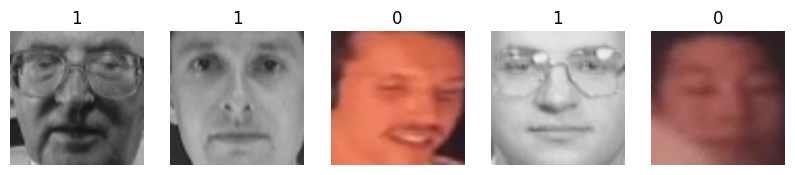

4/4 [==============================] - 3s 761ms/step - loss: 1.0809e-06 - accuracy: 1.0000 - val_loss: 3.5962e-09 - val_accuracy: 1.0000
Epoch 10/20
4/4 [==============================] - ETA: 0s - loss: 1.7778e-06 - accuracy: 1.0000Finita l'epoca 10


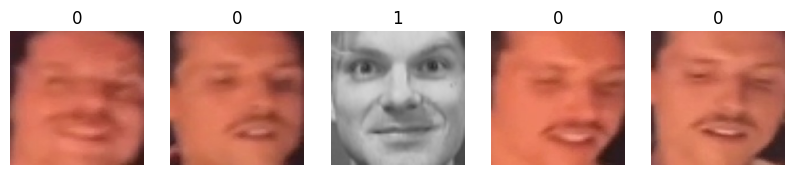

4/4 [==============================] - 3s 739ms/step - loss: 1.7778e-06 - accuracy: 1.0000 - val_loss: 9.7633e-09 - val_accuracy: 1.0000
Epoch 11/20
4/4 [==============================] - ETA: 0s - loss: 1.5139e-05 - accuracy: 1.0000Finita l'epoca 11


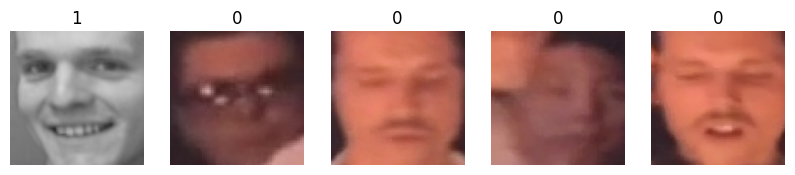

4/4 [==============================] - 7s 2s/step - loss: 1.5139e-05 - accuracy: 1.0000 - val_loss: 1.5950e-08 - val_accuracy: 1.0000
Epoch 12/20
4/4 [==============================] - ETA: 0s - loss: 1.1712e-05 - accuracy: 1.0000Finita l'epoca 12


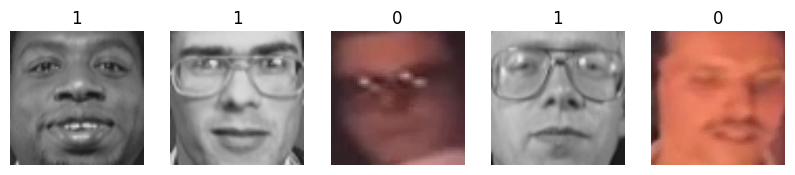

4/4 [==============================] - 7s 2s/step - loss: 1.1712e-05 - accuracy: 1.0000 - val_loss: 4.8177e-10 - val_accuracy: 1.0000
Numero totale di epoche di addestramento completate: 12


In [ ]:
from sklearn.datasets import fetch_olivetti_faces
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import Callback

# Impostazioni della dimensione del batch e della divisione del dataset
batch_size = 256
validation_split = 0.2

# Carica le immagini da /content per la classe 0
images = []
labels = []
for filename in os.listdir('/content/drive/MyDrive/Viso/Immagini'):
    if filename.endswith('.jpg'):
        img_path = os.path.join('/content/drive/MyDrive/Viso/Immagini', filename)
        # Carica l'immagine in modalità 'RGB' per assicurarti che abbia 3 canali
        img = keras_image.load_img(img_path, target_size=(200, 200), color_mode='rgb')
        img_array = keras_image.img_to_array(img)
        # Aggiungi una verifica per assicurarti che i valori dei pixel siano compresi tra 0 e 255
        if np.max(img_array) > 255 or np.min(img_array) < 0:
            raise ValueError(f"I valori dei pixel dell'immagine {filename} sono fuori dall'intervallo [0, 255].")
        # Normalizza i valori dei pixel nel range [0, 1]
        img_array /= 255.0
        images.append(img_array)
        labels.append(0)  # Classe 0 per le immagini in /content

# Verifica che le immagini siano state caricate correttamente
print(f"Caricate {len(images)} immagini.")

# Crea un dataset TensorFlow dal tuo dataset locale
images = np.array(images).astype('float32')
local_dataset = tf.data.Dataset.from_tensor_slices((images, np.array(labels, dtype=np.int32)))

print("Numero di frame in /content:", len(images))

# Carica il dataset Olivetti Faces per la classe 1
olivetti = fetch_olivetti_faces()
olivetti_images = olivetti.images.reshape(-1, 64, 64, 1).astype(np.float32)
olivetti_images = np.repeat(olivetti_images, 3, axis=-1)
print("Olivetti Images Shape:", olivetti_images.shape)  # Stampa le dimensioni delle olivetti_images
olivetti_labels = np.ones(len(olivetti_images), dtype=np.int32)  # Classe 1 per le olivetti_images

# Pre-elabora le immagini Olivetti
olivetti_dataset = tf.data.Dataset.from_tensor_slices((olivetti_images, olivetti_labels))
olivetti_dataset = olivetti_dataset.map(lambda x, y: (tf.image.resize(x, (200, 200)), y))

# Combina i due dataset
combined_data = local_dataset.concatenate(olivetti_dataset).shuffle(buffer_size=1000)

# per visualizzare prima del dataset
#for image_batch, label_batch in combined_data.batch(32).take(1):
#    show_batch(image_batch.numpy(), label_batch.numpy())

frame_count = len([name for name in os.listdir('/content') if name.endswith('.jpg')])
print(f"Numero di frame utilizzati per l'addestramento: {frame_count}")

# Calcola la dimensione del dataset
dataset_size = len(images) + len(olivetti_images)


class TrainingCounter(Callback):
    def on_train_begin(self, logs=None):
        self.epoch_count = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_count += 1
        print(f"Finita l'epoca {self.epoch_count}")




training_counter = TrainingCounter()

# Calcola la dimensione del dataset
dataset_size = len(images) + len(olivetti_images)  # Usa la lunghezza degli array delle immagini
print("Dimensione totale del dataset combinato:", dataset_size)

# Calcola la dimensione dei set di addestramento e validazione
train_size = int((1 - validation_split) * dataset_size)
validation_size = int(dataset_size - train_size)

# Assicurati che ci siano abbastanza immagini per formare almeno un batch
# if train_size < batch_size or validation_size < batch_size:
#    raise ValueError("Il numero totale di immagini non è sufficiente per formare un batch. Diminuisci la dimensione del batch o aumenta il numero di immagini.")

train_dataset = combined_data.take(train_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)
validation_dataset = combined_data.skip(train_size).take(validation_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Calcola steps_per_epoch e validation_steps
steps_per_epoch = np.ceil(train_size / batch_size)
validation_steps = np.ceil(validation_size / batch_size)

# Istanziare il callback
print_random_images_callback = PrintRandomImagesCallback(train_dataset)

# Istanziare il callback per il conteggio delle epoche
training_counter = TrainingCounter()

# Callback per fermare l'addestramento se non vi sono miglioramenti
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Callback per salvare il miglior modello durante l'addestramento
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)


# Addestramento del modello
history = model.fit(
    train_dataset,
    epochs=20,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_dataset,
    validation_steps=validation_steps,
    verbose=1,
    callbacks=[early_stopping, model_checkpoint, training_counter, print_random_images_callback]
)

# Dopo l'addestramento, stampa il numero totale di epoche completate
print(f"Numero totale di epoche di addestramento completate: {training_counter.epoch_count}")

# Presumendo che usi un batch di dimensione 256 come nell'esempio originale
batch_size = 256

# Numero di batch per epoca nel set di addestramento
steps_per_epoch = train_size // batch_size

# Calcola il numero totale di immagini utilizzate per l'addestramento
total_images_used = steps_per_epoch * batch_size * training_counter.epoch_count

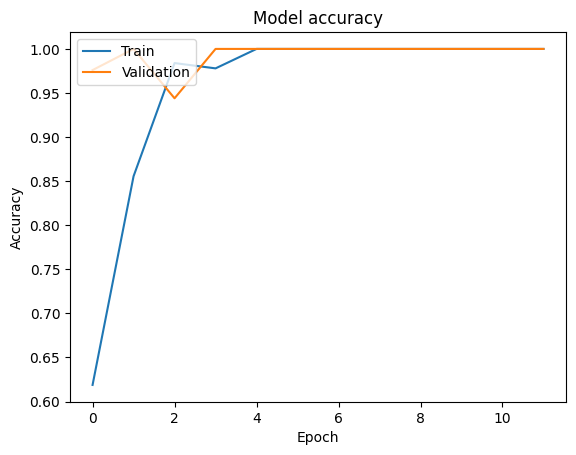

In [ ]:
# Visualizza la storia di addestramento
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Addestramento con un altro dataset a colori

In [ ]:
def bright_filter(image):
    return tf.image.adjust_brightness(image, delta=0.3)

def dark_filter(image):
    return tf.image.adjust_brightness(image, delta=-0.3)

def blue_filter(image):
    blue_image = np.zeros_like(image)
    blue_image[:, :, 0] = image[:, :, 0]
    return blue_image

def random_filter(image, label):
    choice = random.choice([0, 1, 2, 3, 4, 5, 6])
    if choice == 1:
        image = bright_filter(image)
    elif choice == 2:
        image = dark_filter(image)
    elif choice == 3:
        image = blue_filter(image)
    elif choice == 4 or choice == 5 or choice == 6:
        image = image
    return image, label

In [ ]:
import matplotlib.pyplot as plt
import random
from tensorflow.keras.callbacks import Callback

class PrintRandomImagesCallback(Callback):
    def __init__(self, dataset, num_images=5):
        self.dataset = dataset
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        images = []
        labels = []

        # Estrai un numero sufficiente di batch per ottenere un campione rappresentativo di immagini
        for image_batch, label_batch in self.dataset.take(10):
            images.extend(image_batch.numpy())
            labels.extend(label_batch.numpy())

        if len(images) >= self.num_images:
            selected_indices = random.sample(range(len(images)), self.num_images)

            plt.figure(figsize=(15, 15))
            for i, index in enumerate(selected_indices, 1):
                plt.subplot(1, self.num_images, i)
                plt.imshow(images[index])
                plt.title(f'Label: {labels[index]}')
                plt.axis('off')
            plt.show()
        else:
            print("Non ci sono abbastanza immagini per il campionamento.")

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import math

# Funzione per aggiornare il tasso di apprendimento ogni epoca
def step_decay(epoch):
    initial_lrate = 0.01
    drop = 0.5
    epochs_drop = 10.0
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    return lrate

# Definizione del modello con BatchNormalization
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compilazione del modello con un tasso di apprendimento iniziale
opt = Adam(lr=0.0)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
from sklearn.datasets import fetch_lfw_people
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import Callback

# Impostazioni della dimensione del batch e della divisione del dataset
batch_size = 256
validation_split = 0.2

# Carica le immagini da /content per la classe 0
images = []
labels = []
count = 0
max_images = 2500
for filename in os.listdir('/content/drive/MyDrive/Viso/Immagini2'):
    if filename.endswith('.jpg') and count < max_images:
        img_path = os.path.join('/content/drive/MyDrive/Viso/Immagini2', filename)
        try:
          # Carica l'immagine in modalità 'RGB' per assicurarti che abbia 3 canali
          img = keras_image.load_img(img_path, target_size=(200, 200), color_mode='rgb')
          img_array = keras_image.img_to_array(img)
          # Normalizza i valori dei pixel nel range [0, 1]
          img_array /= 255.0
          images.append(img_array)
          labels.append(0)  # Classe 0 per le immagini in /content
          count += 1
        except Exception as e:
            print(f"Errore nel caricamento dell'immagine {filename}: {e}")

# Verifica che le immagini siano state caricate correttamente
print(f"Caricate {len(images)} immagini.")

# Crea un dataset TensorFlow dal tuo dataset locale
images = np.array(images).astype('float32')
local_dataset = tf.data.Dataset.from_tensor_slices((images, np.array(labels, dtype=np.int32)))

print("Numero di frame in /content:", len(images))

# Carica il dataset LFW per la classe 1
lfw_people = fetch_lfw_people(color=True, slice_=(slice(70, 195), slice(78, 172)), resize=0.5)
lfw_images = lfw_people.images[:len(images)]
lfw_labels = np.ones(len(lfw_images), dtype=np.int32)

# Pre-elabora le immagini LFW
lfw_dataset = tf.data.Dataset.from_tensor_slices((lfw_images, lfw_labels))
lfw_dataset = lfw_dataset.map(lambda x, y: (tf.image.resize(x, (200, 200)), y))

# Combina i due dataset
combined_data = local_dataset.concatenate(lfw_dataset).shuffle(buffer_size=1000)


# per visualizzare prima del dataset
#for image_batch, label_batch in combined_data.batch(32).take(1):
#    show_batch(image_batch.numpy(), label_batch.numpy())

frame_count = len([name for name in os.listdir('/content/drive/MyDrive/Viso/Immagini2') if name.endswith('.jpg')])
print(f"Numero di frame utilizzati per l'addestramento: {frame_count}")

# Calcola la dimensione del dataset
dataset_size = len(images) + len(lfw_images)
print("Dimensione totale del dataset combinato:", dataset_size)

class TrainingCounter(Callback):
    def on_train_begin(self, logs=None):
        self.epoch_count = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_count += 1
        print(f"Finita l'epoca {self.epoch_count}")


In [ ]:
from sklearn.datasets import fetch_lfw_people
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import Callback

# Impostazioni della dimensione del batch e della divisione del dataset
batch_size = 256
validation_split = 0.2

# Carica le immagini da /content per la classe 0
images = []
labels = []
count = 0
max_images = 250
for filename in os.listdir('/content/drive/MyDrive/Viso/Immagini2'):
    if filename.endswith('.jpg') and count < max_images:
        img_path = os.path.join('/content/drive/MyDrive/Viso/Immagini2', filename)
        try:
          # Carica l'immagine in modalità 'RGB' per assicurarti che abbia 3 canali
          img = keras_image.load_img(img_path, target_size=(200, 200), color_mode='rgb')
          img_array = keras_image.img_to_array(img)
          # Normalizza i valori dei pixel nel range [0, 1]
          img_array /= 255.0
          images.append(img_array)
          labels.append(0)  # Classe 0 per le immagini in /content
          count += 1
        except Exception as e:
            print(f"Errore nel caricamento dell'immagine {filename}: {e}")

# Verifica che le immagini siano state caricate correttamente
print(f"Caricate {len(images)} immagini.")

# Crea un dataset TensorFlow dal tuo dataset locale
images = np.array(images).astype('float32')
local_dataset = tf.data.Dataset.from_tensor_slices((images, np.array(labels, dtype=np.int32)))

print("Numero di frame in /content:", len(images))

# Carica il dataset LFW per la classe 1
lfw_people = fetch_lfw_people(color=True, slice_=(slice(70, 195), slice(78, 172)), resize=0.5)
lfw_images = lfw_people.images[:len(images)]
lfw_labels = np.ones(len(lfw_images), dtype=np.int32)

# Pre-elabora le immagini LFW
lfw_dataset = tf.data.Dataset.from_tensor_slices((lfw_images, lfw_labels))
lfw_dataset = lfw_dataset.map(lambda x, y: (tf.image.resize(x, (200, 200)), y))

# Combina i due dataset
combined_data = local_dataset.concatenate(lfw_dataset).shuffle(buffer_size=1000)


# per visualizzare prima del dataset
#for image_batch, label_batch in combined_data.batch(32).take(1):
#    show_batch(image_batch.numpy(), label_batch.numpy())

frame_count = len([name for name in os.listdir('/content/drive/MyDrive/Viso/Immagini2') if name.endswith('.jpg')])
print(f"Numero di frame utilizzati per l'addestramento: {frame_count}")

# Calcola la dimensione del dataset
dataset_size = len(images) + len(lfw_images)
print("Dimensione totale del dataset combinato:", dataset_size)

class TrainingCounter(Callback):
    def on_train_begin(self, logs=None):
        self.epoch_count = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_count += 1
        print(f"Finita l'epoca {self.epoch_count}")




training_counter = TrainingCounter()

# Calcola la dimensione del dataset
dataset_size = len(images) + len(lfw_images)  # Usa la lunghezza degli array delle immagini
print("Dimensione totale del dataset combinato:", dataset_size)

# Calcola la dimensione dei set di addestramento e validazione
train_size = int((1 - validation_split) * dataset_size)
validation_size = int(dataset_size - train_size)

# Assicurati che ci siano abbastanza immagini per formare almeno un batch
# if train_size < batch_size or validation_size < batch_size:
#    raise ValueError("Il numero totale di immagini non è sufficiente per formare un batch. Diminuisci la dimensione del batch o aumenta il numero di immagini.")

train_dataset = combined_data.take(train_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)
validation_dataset = combined_data.skip(train_size).take(validation_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Calcola steps_per_epoch e validation_steps
steps_per_epoch = np.ceil(train_size / batch_size)
validation_steps = np.ceil(validation_size / batch_size)

# Istanziare il callback
print_random_images_callback = PrintRandomImagesCallback(train_dataset)

# Istanziare il callback per il conteggio delle epoche
training_counter = TrainingCounter()

# Callback per fermare l'addestramento se non vi sono miglioramenti
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Callback per salvare il miglior modello durante l'addestramento
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)

# Creazione dei callbacks per la scheda del tasso di apprendimento e gli altri meccanismi di early stopping e checkpoint
lrate = LearningRateScheduler(step_decay)
early_stopping = EarlyStopping(monitor='val_loss', patience=10)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)


# Addestramento del modello con i nuovi callback
history = model.fit(
    train_dataset,
    epochs=20,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_dataset,
    validation_steps=validation_steps,
    verbose=1,
    callbacks=[lrate, early_stopping, model_checkpoint, training_counter, print_random_images_callback]
)

# Dopo l'addestramento, stampa il numero totale di epoche completate
print(f"Numero totale di epoche di addestramento completate: {training_counter.epoch_count}")

# Presumendo che usi un batch di dimensione 256 come nell'esempio originale
batch_size = 256

# Numero di batch per epoca nel set di addestramento
steps_per_epoch = train_size // batch_size

# Calcola il numero totale di immagini utilizzate per l'addestramento
total_images_used = steps_per_epoch * batch_size * training_counter.epoch_count

KeyboardInterrupt: 

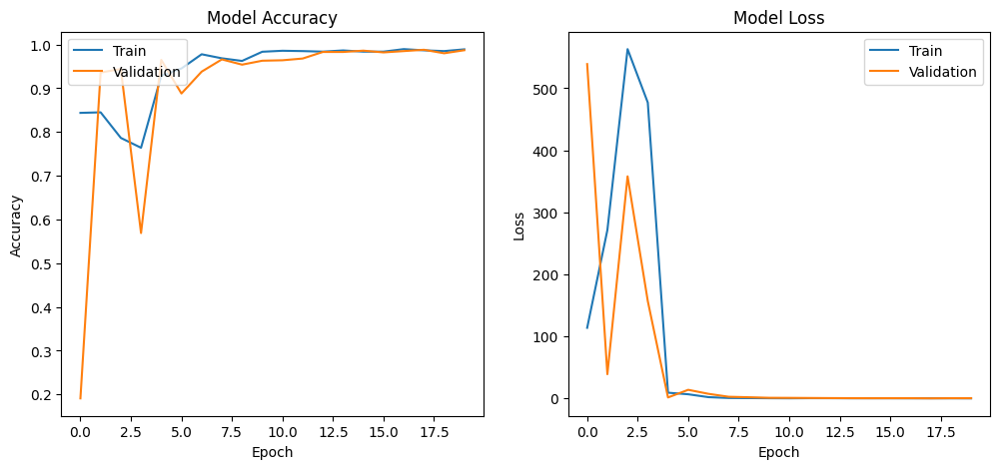

In [ ]:
import matplotlib.pyplot as plt

# Grafico dell'accuratezza
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Grafico della perdita
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.show()


# Termico

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import os
import numpy as np
from sklearn.datasets import fetch_lfw_people
from tensorflow.keras.preprocessing import image as keras_image
import math

# Funzione per convertire le immagini in bianco e nero
def convert_to_grayscale(img):
    return tf.image.rgb_to_grayscale(img)

# Modello aggiornato per immagini in bianco e nero
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 1)),  # Modifica qui per 1 canale
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compilazione del modello
opt = Adam(lr=0.0)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
import matplotlib.pyplot as plt
import random
from tensorflow.keras.callbacks import Callback

class PrintRandomImagesCallback(Callback):
    def __init__(self, dataset, num_images=5):
        self.dataset = dataset
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        images = []
        labels = []

        # Estrai un numero sufficiente di batch per ottenere un campione rappresentativo di immagini
        for image_batch, label_batch in self.dataset.take(10):
            images.extend(image_batch.numpy())
            labels.extend(label_batch.numpy())

        if len(images) >= self.num_images:
            selected_indices = random.sample(range(len(images)), self.num_images)

            plt.figure(figsize=(15, 15))
            for i, index in enumerate(selected_indices, 1):
                plt.subplot(1, self.num_images, i)
                plt.imshow(images[index])
                plt.title(f'Label: {labels[index]}')
                plt.axis('off')
            plt.show()
        else:
            print("Non ci sono abbastanza immagini per il campionamento.")

In [ ]:
class TrainingCounter(Callback):
    def on_train_begin(self, logs=None):
        self.epoch_count = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_count += 1
        print(f"Finita l'epoca {self.epoch_count}")

In [ ]:

# Funzione di aggiornamento del tasso di apprendimento
def step_decay(epoch):
    initial_lrate = 0.01
    drop = 0.5
    epochs_drop = 10.0
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    return lrate

batch_size = 256
validation_split = 0.2

# Caricamento e conversione delle immagini in bianco e nero
images = []
labels = []
count = 0
max_images = 2500
for filename in os.listdir('/content/drive/MyDrive/Viso/Immagini2'):
    if filename.endswith('.jpg') and count < max_images:
        img_path = os.path.join('/content/drive/MyDrive/Viso/Immagini2', filename)
        try:
            img = keras_image.load_img(img_path, target_size=(200, 200), color_mode='grayscale')  # Carica in grayscale
            img_array = keras_image.img_to_array(img)
            img_array /= 255.0
            images.append(img_array)
            labels.append(0)
            count += 1
        except Exception as e:
            print(f"Errore nel caricamento dell'immagine {filename}: {e}")

In [ ]:
# Carica il dataset LFW e convertilo in bianco e nero con ridimensionamento
lfw_people = fetch_lfw_people(color=True, slice_=(slice(70, 195), slice(78, 172)), resize=0.5)
lfw_images_resized = []
for img in lfw_people.images[:len(images)]:
    img_resized = tf.image.resize(img, (200, 200))  # Ridimensiona l'immagine
    img_gray = convert_to_grayscale(img_resized)  # Converti in bianco e nero
    lfw_images_resized.append(img_gray.numpy())

lfw_images = np.array(lfw_images_resized)
lfw_labels = np.ones(len(lfw_images), dtype=np.int32)

Epoch 1/30
 6/16 [==========>...................] - ETA: 2s - loss: 5.1814 - accuracy: 0.9570

16/16 [==============================] - ETA: 0s - loss: 194.6423 - accuracy: 0.8848Finita l'epoca 1


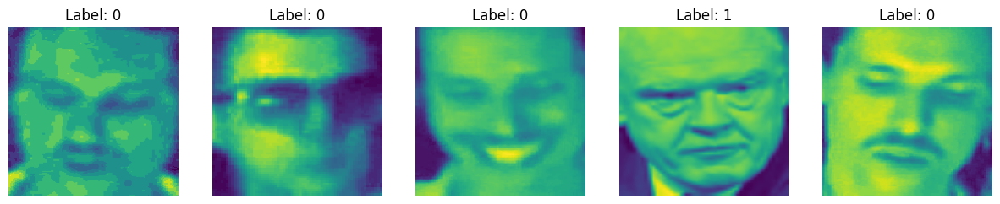

16/16 [==============================] - 15s 855ms/step - loss: 194.6423 - accuracy: 0.8848 - val_loss: 5339.6748 - val_accuracy: 0.0780 - lr: 0.0100
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 316.7015 - accuracy: 0.7853Finita l'epoca 2


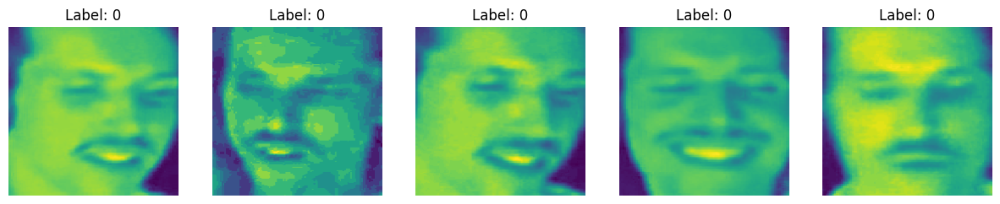

16/16 [==============================] - 7s 420ms/step - loss: 316.7015 - accuracy: 0.7853 - val_loss: 440.8236 - val_accuracy: 0.3120 - lr: 0.0100
Epoch 3/30
16/16 [==============================] - ETA: 0s - loss: 416.4442 - accuracy: 0.7770Finita l'epoca 3


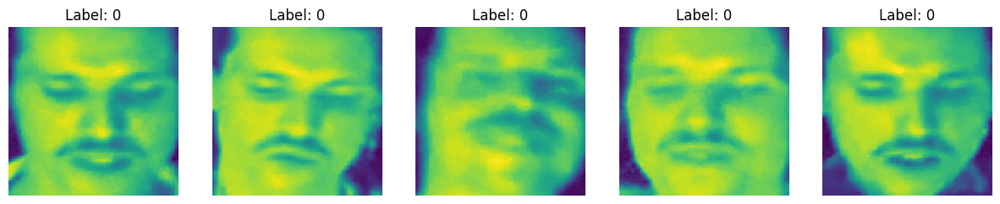

16/16 [==============================] - 5s 329ms/step - loss: 416.4442 - accuracy: 0.7770 - val_loss: 564.3367 - val_accuracy: 0.1910 - lr: 0.0100
Epoch 4/30
16/16 [==============================] - ETA: 0s - loss: 172.9298 - accuracy: 0.8115Finita l'epoca 4


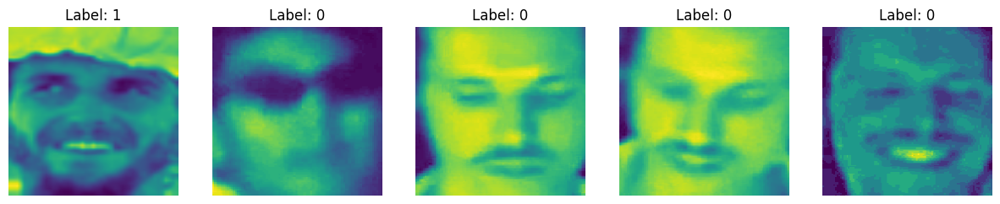

16/16 [==============================] - 6s 365ms/step - loss: 172.9298 - accuracy: 0.8115 - val_loss: 23.3570 - val_accuracy: 0.9290 - lr: 0.0100
Epoch 5/30
16/16 [==============================] - ETA: 0s - loss: 69.3602 - accuracy: 0.9097Finita l'epoca 5


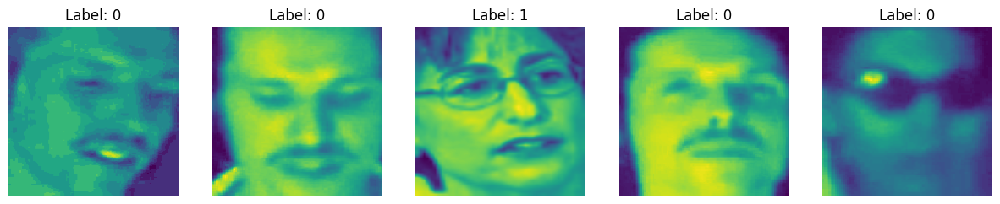

16/16 [==============================] - 5s 328ms/step - loss: 69.3602 - accuracy: 0.9097 - val_loss: 68.5342 - val_accuracy: 0.6840 - lr: 0.0100
Epoch 6/30
16/16 [==============================] - ETA: 0s - loss: 4.8478 - accuracy: 0.9513Finita l'epoca 6


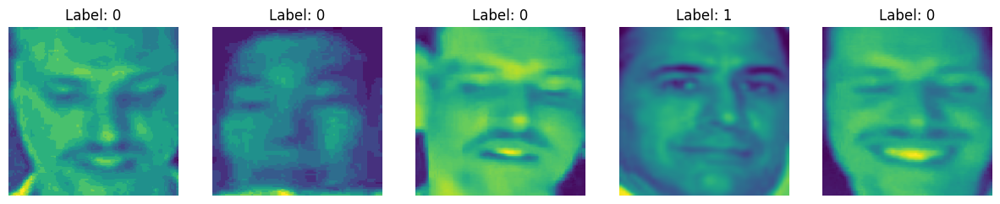

16/16 [==============================] - 7s 448ms/step - loss: 4.8478 - accuracy: 0.9513 - val_loss: 21.5969 - val_accuracy: 0.5890 - lr: 0.0100
Epoch 7/30
16/16 [==============================] - ETA: 0s - loss: 3.4730 - accuracy: 0.9530Finita l'epoca 7


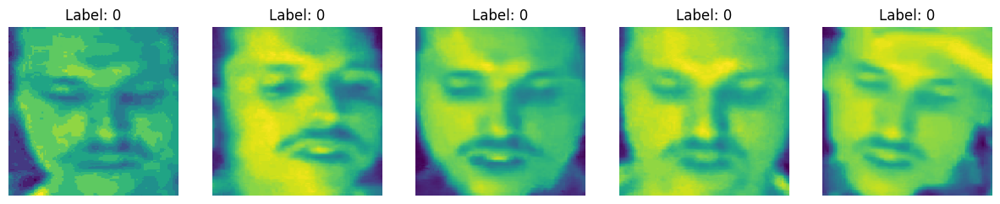

16/16 [==============================] - 6s 360ms/step - loss: 3.4730 - accuracy: 0.9530 - val_loss: 28.8333 - val_accuracy: 0.4300 - lr: 0.0100
Epoch 8/30
16/16 [==============================] - ETA: 0s - loss: 2.5676 - accuracy: 0.9712Finita l'epoca 8


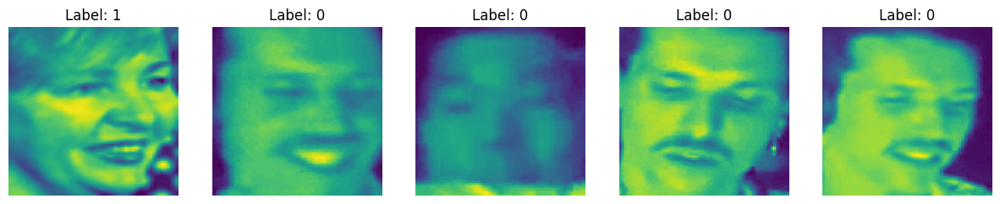

16/16 [==============================] - 6s 382ms/step - loss: 2.5676 - accuracy: 0.9712 - val_loss: 11.0160 - val_accuracy: 0.5470 - lr: 0.0100
Epoch 9/30
16/16 [==============================] - ETA: 0s - loss: 1.0747 - accuracy: 0.9762Finita l'epoca 9


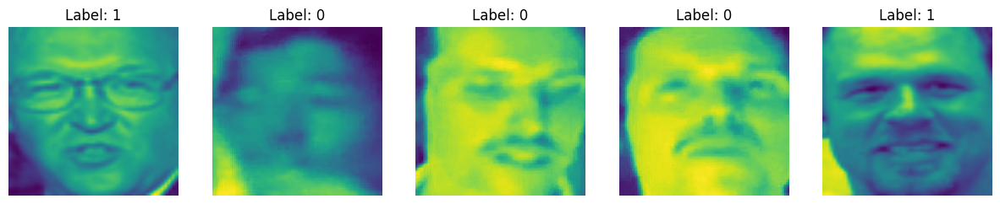

16/16 [==============================] - 6s 374ms/step - loss: 1.0747 - accuracy: 0.9762 - val_loss: 1.7262 - val_accuracy: 0.8220 - lr: 0.0100
Epoch 10/30
16/16 [==============================] - ETA: 0s - loss: 1.0240 - accuracy: 0.9695Finita l'epoca 10


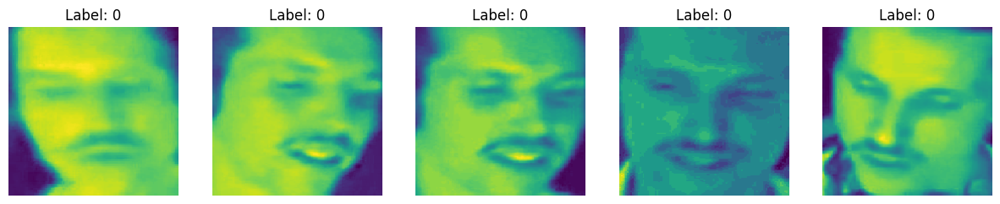

16/16 [==============================] - 7s 434ms/step - loss: 1.0240 - accuracy: 0.9695 - val_loss: 1.5627 - val_accuracy: 0.8300 - lr: 0.0050
Epoch 11/30
16/16 [==============================] - ETA: 0s - loss: 0.4931 - accuracy: 0.9743Finita l'epoca 11


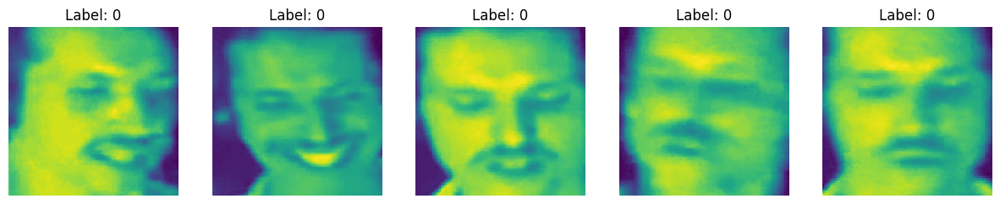

16/16 [==============================] - 6s 374ms/step - loss: 0.4931 - accuracy: 0.9743 - val_loss: 1.3726 - val_accuracy: 0.8060 - lr: 0.0050
Epoch 12/30
16/16 [==============================] - ETA: 0s - loss: 0.8379 - accuracy: 0.9735Finita l'epoca 12


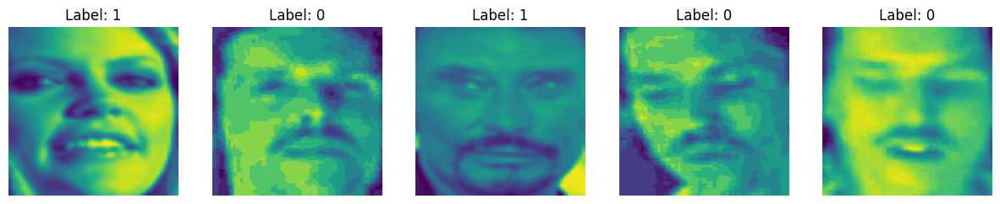

16/16 [==============================] - 6s 364ms/step - loss: 0.8379 - accuracy: 0.9735 - val_loss: 1.5742 - val_accuracy: 0.7380 - lr: 0.0050
Epoch 13/30
16/16 [==============================] - ETA: 0s - loss: 0.4385 - accuracy: 0.9722Finita l'epoca 13


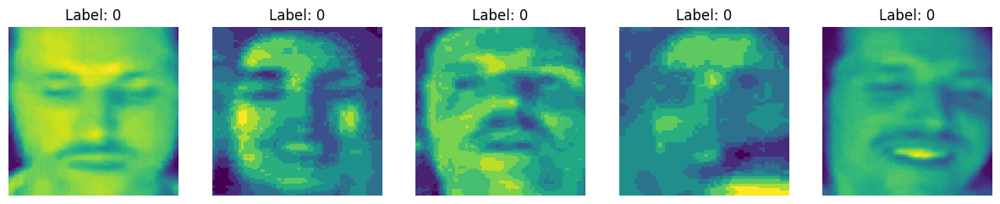

16/16 [==============================] - 6s 367ms/step - loss: 0.4385 - accuracy: 0.9722 - val_loss: 1.1817 - val_accuracy: 0.6920 - lr: 0.0050
Epoch 14/30
16/16 [==============================] - ETA: 0s - loss: 0.5707 - accuracy: 0.9737Finita l'epoca 14


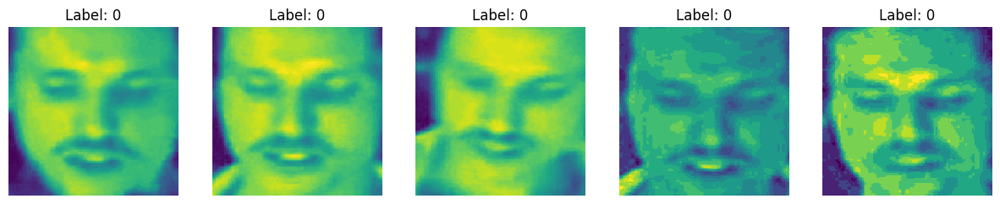

16/16 [==============================] - 7s 464ms/step - loss: 0.5707 - accuracy: 0.9737 - val_loss: 0.8868 - val_accuracy: 0.7130 - lr: 0.0050
Epoch 15/30
16/16 [==============================] - ETA: 0s - loss: 0.4603 - accuracy: 0.9740Finita l'epoca 15


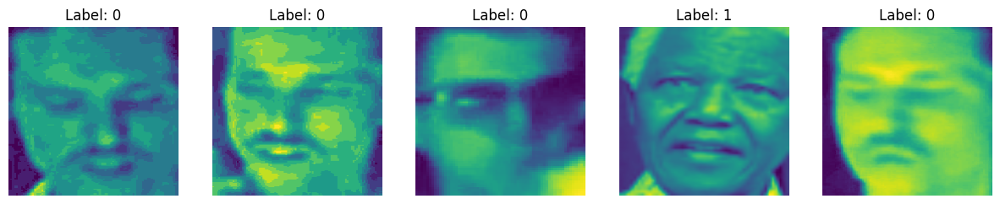

16/16 [==============================] - 6s 408ms/step - loss: 0.4603 - accuracy: 0.9740 - val_loss: 0.8653 - val_accuracy: 0.6770 - lr: 0.0050
Epoch 16/30
16/16 [==============================] - ETA: 0s - loss: 0.7213 - accuracy: 0.9712Finita l'epoca 16


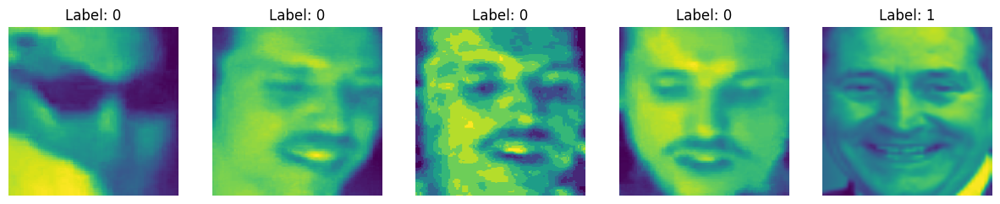

16/16 [==============================] - 7s 424ms/step - loss: 0.7213 - accuracy: 0.9712 - val_loss: 0.6876 - val_accuracy: 0.6790 - lr: 0.0050
Epoch 17/30
16/16 [==============================] - ETA: 0s - loss: 0.6175 - accuracy: 0.9735Finita l'epoca 17


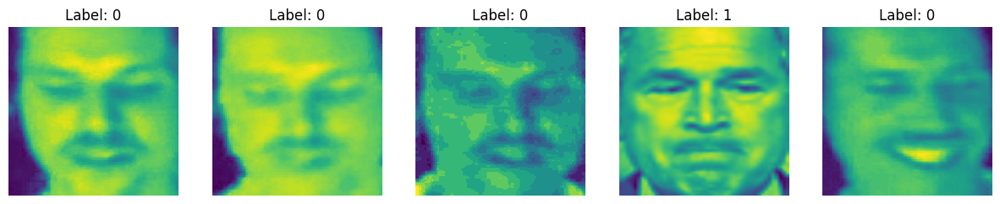

16/16 [==============================] - 6s 376ms/step - loss: 0.6175 - accuracy: 0.9735 - val_loss: 0.6561 - val_accuracy: 0.7230 - lr: 0.0050
Epoch 18/30
16/16 [==============================] - ETA: 0s - loss: 0.4194 - accuracy: 0.9728Finita l'epoca 18


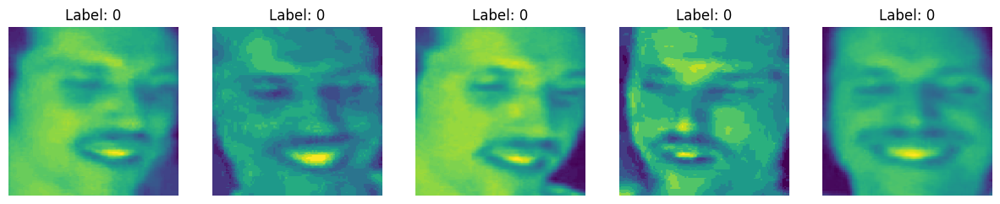

16/16 [==============================] - 5s 345ms/step - loss: 0.4194 - accuracy: 0.9728 - val_loss: 0.8283 - val_accuracy: 0.7570 - lr: 0.0050
Epoch 19/30
16/16 [==============================] - ETA: 0s - loss: 0.4615 - accuracy: 0.9730Finita l'epoca 19


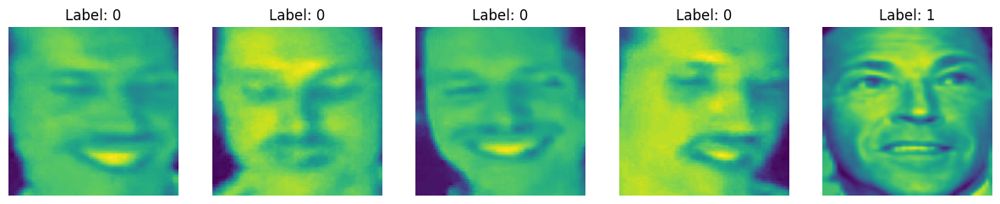

16/16 [==============================] - 6s 373ms/step - loss: 0.4615 - accuracy: 0.9730 - val_loss: 0.9090 - val_accuracy: 0.7610 - lr: 0.0050
Epoch 20/30
16/16 [==============================] - ETA: 0s - loss: 0.3281 - accuracy: 0.9765Finita l'epoca 20


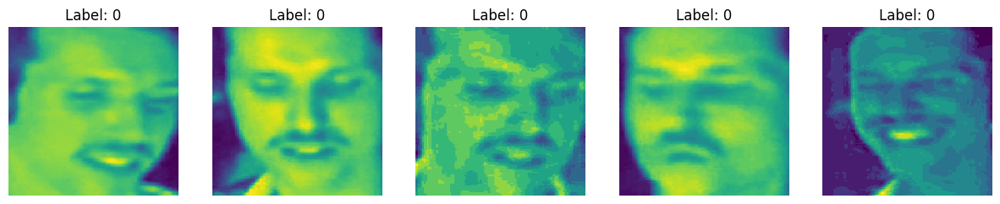

16/16 [==============================] - 6s 350ms/step - loss: 0.3281 - accuracy: 0.9765 - val_loss: 1.2213 - val_accuracy: 0.7860 - lr: 0.0025
Epoch 21/30
16/16 [==============================] - ETA: 0s - loss: 0.3812 - accuracy: 0.9758Finita l'epoca 21


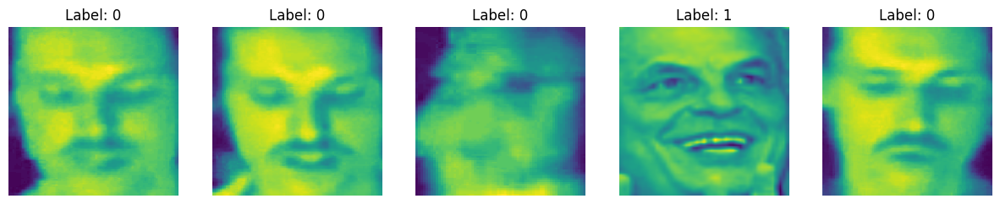

16/16 [==============================] - 6s 346ms/step - loss: 0.3812 - accuracy: 0.9758 - val_loss: 0.9191 - val_accuracy: 0.7980 - lr: 0.0025
Epoch 22/30
16/16 [==============================] - ETA: 0s - loss: 0.2723 - accuracy: 0.9790Finita l'epoca 22


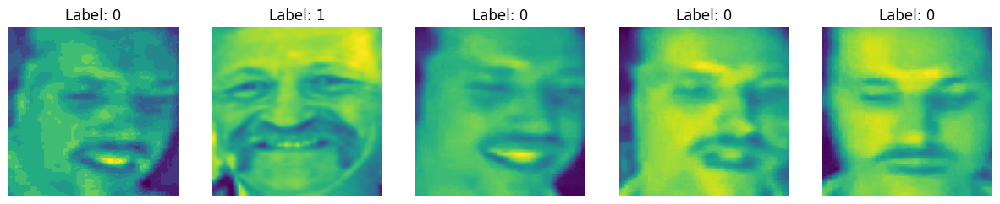

16/16 [==============================] - 6s 371ms/step - loss: 0.2723 - accuracy: 0.9790 - val_loss: 1.0921 - val_accuracy: 0.8130 - lr: 0.0025
Epoch 23/30
16/16 [==============================] - ETA: 0s - loss: 0.2612 - accuracy: 0.9783Finita l'epoca 23


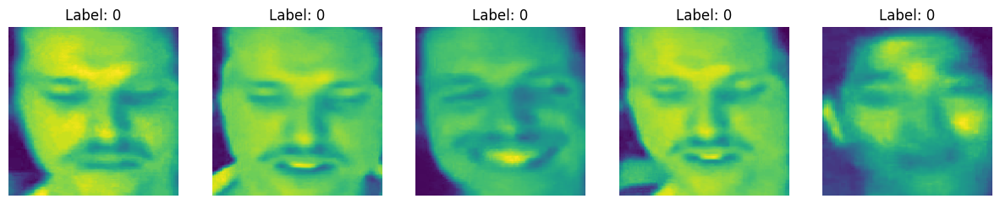

16/16 [==============================] - 6s 385ms/step - loss: 0.2612 - accuracy: 0.9783 - val_loss: 0.8524 - val_accuracy: 0.8560 - lr: 0.0025
Epoch 24/30
16/16 [==============================] - ETA: 0s - loss: 0.2035 - accuracy: 0.9772Finita l'epoca 24


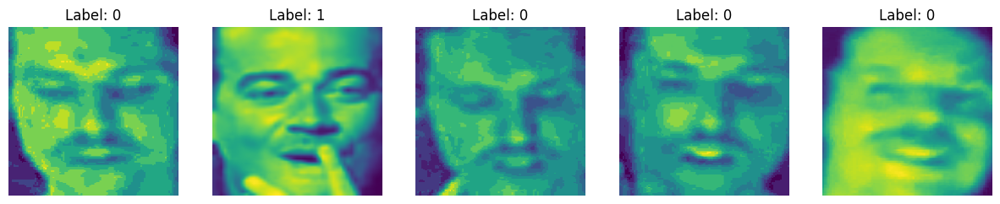

16/16 [==============================] - 5s 345ms/step - loss: 0.2035 - accuracy: 0.9772 - val_loss: 0.7938 - val_accuracy: 0.8880 - lr: 0.0025
Epoch 25/30
16/16 [==============================] - ETA: 0s - loss: 0.1655 - accuracy: 0.9787Finita l'epoca 25


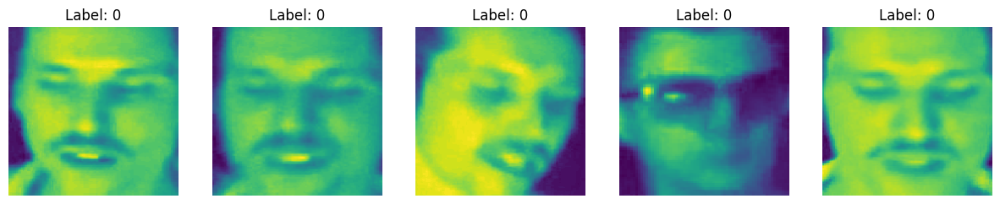

16/16 [==============================] - 5s 333ms/step - loss: 0.1655 - accuracy: 0.9787 - val_loss: 0.9341 - val_accuracy: 0.9220 - lr: 0.0025
Epoch 26/30
16/16 [==============================] - ETA: 0s - loss: 0.3691 - accuracy: 0.9793Finita l'epoca 26


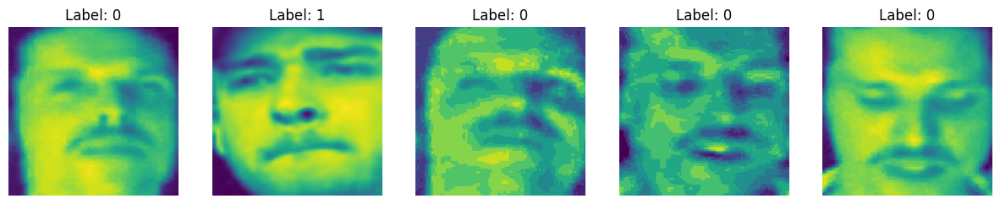

16/16 [==============================] - 5s 329ms/step - loss: 0.3691 - accuracy: 0.9793 - val_loss: 0.8205 - val_accuracy: 0.9390 - lr: 0.0025
Epoch 27/30
16/16 [==============================] - ETA: 0s - loss: 0.1343 - accuracy: 0.9815Finita l'epoca 27


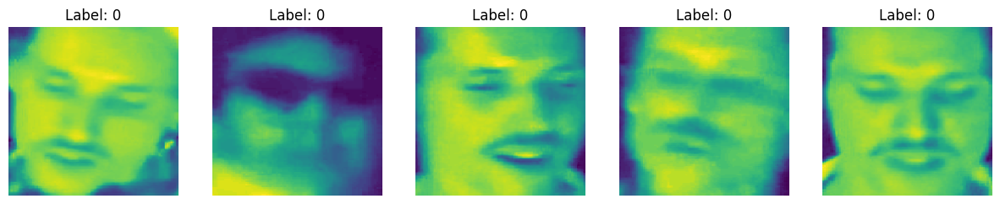

16/16 [==============================] - 5s 333ms/step - loss: 0.1343 - accuracy: 0.9815 - val_loss: 0.6838 - val_accuracy: 0.9470 - lr: 0.0025
Numero totale di epoche di addestramento completate: 27


In [ ]:
# Preparazione dei dataset
images = np.array(images).astype('float32')
labels = np.array(labels, dtype=np.int32)
local_dataset = tf.data.Dataset.from_tensor_slices((images, labels))

lfw_dataset = tf.data.Dataset.from_tensor_slices((lfw_images, lfw_labels))

# Combina i due dataset
combined_data = local_dataset.concatenate(lfw_dataset).shuffle(buffer_size=1000)


train_size = int((1 - validation_split) * (len(images) + len(lfw_images)))
validation_size = (len(images) + len(lfw_images)) - train_size

train_dataset = combined_data.take(train_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)
validation_dataset = combined_data.skip(train_size).take(validation_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Callbacks
lrate = LearningRateScheduler(step_decay)
early_stopping = EarlyStopping(monitor='val_loss', patience=10)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)
# Istanziare il callback
print_random_images_callback = PrintRandomImagesCallback(train_dataset)
# Istanziare il callback per il conteggio delle epoche
training_counter = TrainingCounter()

# Addestramento del modello
history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=[lrate, early_stopping, model_checkpoint, training_counter, print_random_images_callback]
)

# Dopo l'addestramento, stampa il numero totale di epoche completate
print(f"Numero totale di epoche di addestramento completate: {training_counter.epoch_count}")

# Presumendo che usi un batch di dimensione 256 come nell'esempio originale
batch_size = 256

# Numero di batch per epoca nel set di addestramento
steps_per_epoch = train_size // batch_size

# Calcola il numero totale di immagini utilizzate per l'addestramento
total_images_used = steps_per_epoch * batch_size * training_counter.epoch_count

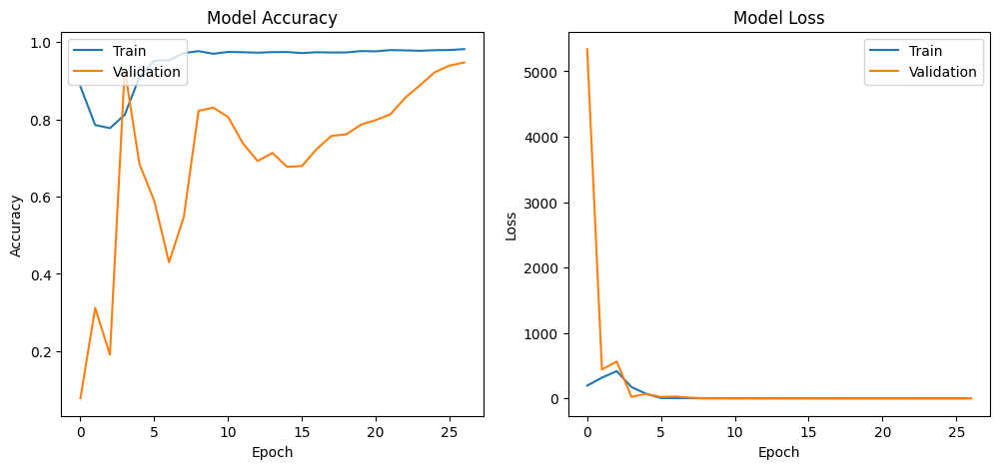

In [ ]:
import matplotlib.pyplot as plt

# Grafico dell'accuratezza
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Grafico della perdita
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.show()

# FaceNet + Metric Learning e Triplet Loss

In [ ]:
import matplotlib.pyplot as plt
import random
from tensorflow.keras.callbacks import Callback

class PrintRandomImagesCallback(Callback):
    def __init__(self, dataset, num_images=5):
        self.dataset = dataset
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        images = []
        labels = []

        # Estrai un numero sufficiente di batch per ottenere un campione rappresentativo di immagini
        for image_batch, label_batch in self.dataset.take(10):
            images.extend(image_batch.numpy())
            labels.extend(label_batch.numpy())

        if len(images) >= self.num_images:
            selected_indices = random.sample(range(len(images)), self.num_images)

            plt.figure(figsize=(15, 15))
            for i, index in enumerate(selected_indices, 1):
                plt.subplot(1, self.num_images, i)
                plt.imshow(images[index])
                plt.title(f'Label: {labels[index]}')
                plt.axis('off')
            plt.show()
        else:
            print("Non ci sono abbastanza immagini per il campionamento.")

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import math

# Funzione per aggiornare il tasso di apprendimento ogni epoca
def step_decay(epoch):
    initial_lrate = 0.01
    drop = 0.5
    epochs_drop = 10.0
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    return lrate

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Lambda
import tensorflow as tf

# Carica un modello preaddestrato come base per l'estrazione delle caratteristiche
base_model = ResNet50(weights='imagenet', include_top=False)

# Aggiungi GlobalAveragePooling per ridurre la dimensionalità
x = base_model.output
x = GlobalAveragePooling2D()(x)

# Normalizza le feature per facilitare il calcolo della distanza euclidea
x = Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)

# Definisci il modello finale per l'estrazione delle caratteristiche
feature_model = Model(inputs=base_model.input, outputs=x)

# Rendi addestrabili gli ultimi N layer (ad esempio gli ultimi 5 layer)
for layer in base_model.layers[:-5]:
    layer.trainable = False
for layer in base_model.layers[-5:]:
    layer.trainable = True

In [ ]:

class GradientMonitor(tf.keras.callbacks.Callback):
    def __init__(self, model, x_train_sample, y_train_sample):
        super().__init__()
        self.model = model
        self.x_train_sample = x_train_sample
        self.y_train_sample = y_train_sample

    def on_train_batch_end(self, batch, logs=None):
        with tf.GradientTape() as tape:
            # Monitora le variabili addestrabili
            tape.watch(self.model.trainable_variables)
            # Effettua una predizione
            predictions = self.model(self.x_train_sample, training=True)
            # Calcola la loss utilizzando le etichette vere
            loss = self.model.compiled_loss(
                self.y_train_sample, predictions, regularization_losses=self.model.losses)

        # Calcola i gradienti della loss rispetto ai layer addestrabili
        gradients = tape.gradient(loss, self.model.trainable_variables)

        # Stampa o registra i gradienti (qui stampiamo la norma L2 dei gradienti per semplicità)
        grad_norms = [tf.norm(grad).numpy() for grad in gradients if grad is not None]
        print(f"Norma L2 dei gradienti al batch {batch}: {grad_norms}")


In [ ]:
from sklearn.datasets import fetch_lfw_people
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import Callback

# Impostazioni della dimensione del batch e della divisione del dataset
batch_size = 64       # oppure 256 con dataset più grandi
validation_split = 0.2

# Carica le immagini da /content per la classe 0
images = []
labels = []
count = 0
max_images = 1000
for filename in os.listdir('/content/drive/MyDrive/Viso/Immagini2'):
    if filename.endswith('.jpg') and count < max_images:
        img_path = os.path.join('/content/drive/MyDrive/Viso/Immagini2', filename)
        try:
          # Carica l'immagine in modalità 'RGB' per assicurarti che abbia 3 canali
          img = keras_image.load_img(img_path, target_size=(200, 200), color_mode='rgb')
          img_array = keras_image.img_to_array(img)
          # Normalizza i valori dei pixel nel range [0, 1]
          img_array /= 255.0
          images.append(img_array)
          labels.append(0)  # Classe 0 per le immagini in /content
          count += 1
        except Exception as e:
            print(f"Errore nel caricamento dell'immagine {filename}: {e}")

# Verifica che le immagini siano state caricate correttamente
print(f"Caricate {len(images)} immagini.")

# Crea un dataset TensorFlow dal tuo dataset locale
images = np.array(images).astype('float32')
local_dataset = tf.data.Dataset.from_tensor_slices((images, np.array(labels, dtype=np.int32)))

print("Numero di frame in /content:", len(images))

# Carica il dataset LFW per la classe 1
lfw_people = fetch_lfw_people(color=True, slice_=(slice(70, 195), slice(78, 172)), resize=0.5)
lfw_images = lfw_people.images[:len(images)]
lfw_labels = np.ones(len(lfw_images), dtype=np.int32)

# Pre-elabora le immagini LFW
lfw_dataset = tf.data.Dataset.from_tensor_slices((lfw_images, lfw_labels))
lfw_dataset = lfw_dataset.map(lambda x, y: (tf.image.resize(x, (200, 200)), y))

# Combina i due dataset
combined_data = local_dataset.concatenate(lfw_dataset).shuffle(buffer_size=1000)


# per visualizzare prima del dataset
#for image_batch, label_batch in combined_data.batch(32).take(1):
#    show_batch(image_batch.numpy(), label_batch.numpy())

frame_count = len([name for name in os.listdir('/content/drive/MyDrive/Viso/Immagini2') if name.endswith('.jpg')])
print(f"Numero di frame utilizzati per l'addestramento: {frame_count}")

# Calcola la dimensione del dataset
dataset_size = len(images) + len(lfw_images)
print("Dimensione totale del dataset combinato:", dataset_size)

class TrainingCounter(Callback):
    def on_train_begin(self, logs=None):
        self.epoch_count = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_count += 1
        print(f"Finita l'epoca {self.epoch_count}")


Caricate 1000 immagini.
Numero di frame in /content: 1000
Numero di frame utilizzati per l'addestramento: 3384
Dimensione totale del dataset combinato: 2000


In [ ]:
# Funzione per assicurarsi che il dataset sia divisibile per il numero richiesto
def make_divisible_by(dataset, divisible_by):
    remainder = len(dataset) % divisible_by
    if remainder != 0:
        extra = divisible_by - remainder
        dataset_extra = dataset.take(extra)
        dataset = dataset.concatenate(dataset_extra)
    return dataset

# Assicurati che il numero di immagini sia divisibile per (batch_size * 3) prima di creare il dataset
combined_data = make_divisible_by(combined_data, batch_size * 3)


In [ ]:
def triplet_loss(alpha=0.2):
    def loss(y_true, y_pred):
        # Calcola la lunghezza totale dell'embedding per ciascuno dei tre elementi della tripletta
        total_length = y_pred.shape[1]
        # Assicurati che la lunghezza totale sia divisibile per 3
        third_length = total_length // 3 * 3

        # Tronca y_pred se non è divisibile per 3
        y_pred = y_pred[:, :third_length]

        # Ora possiamo assumere che y_pred è divisibile per 3
        anchor, positive, negative = y_pred[:,:third_length//3], y_pred[:,third_length//3:2*third_length//3], y_pred[:,2*third_length//3:]

        # Calcola la distanza euclidea tra gli embeddings
        pos_dist = tf.reduce_sum(tf.square(anchor - positive), axis=1)
        neg_dist = tf.reduce_sum(tf.square(anchor - negative), axis=1)

        # Calcola la triplet loss
        basic_loss = pos_dist - neg_dist + alpha
        loss = tf.reduce_mean(tf.maximum(basic_loss, 0.0))

        return loss

    return loss


def triplet_accuracy(alpha=0.2):
    def accuracy(y_true, y_pred):
        # Calcola la lunghezza totale dell'embedding per ciascuno dei tre elementi della tripletta
        total_length = y_pred.shape[1]
        third_length = total_length // 3

        # Se la lunghezza non è un multiplo di 3, taglia gli extra per fare in modo che sia divisibile
        if total_length % 3 != 0:
            y_pred = y_pred[:, :third_length * 3]

        anchor = y_pred[:, :third_length]
        positive = y_pred[:, third_length:third_length * 2]
        negative = y_pred[:, third_length * 2:]

        pos_dist = tf.reduce_sum(tf.square(anchor - positive), axis=1)
        neg_dist = tf.reduce_sum(tf.square(anchor - negative), axis=1)

        # Calcola se la distanza positiva è minore di quella negativa
        correct_predictions = tf.less(pos_dist + alpha, neg_dist)

        # Calcola la media per ottenere l'accuratezza
        return tf.reduce_mean(tf.cast(correct_predictions, tf.float32))

    return accuracy



Dimensione totale del dataset combinato: 2000
Epoch 1/10
Norma L2 dei gradienti al batch 0: [0.66899943, 8.0526355e-08, 0.026054934, 0.050112933]
 6/25 [======>.......................] - ETA: 13s - loss: 0.1920 - accuracy: 0.0000e+00

Norma L2 dei gradienti al batch 6: [0.20263934, 2.9706108e-08, 0.023519017, 0.05310875]
25/25 [==============================] - ETA: 0s - loss: 0.0833 - accuracy: 0.0000e+00

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Finita l'epoca 1


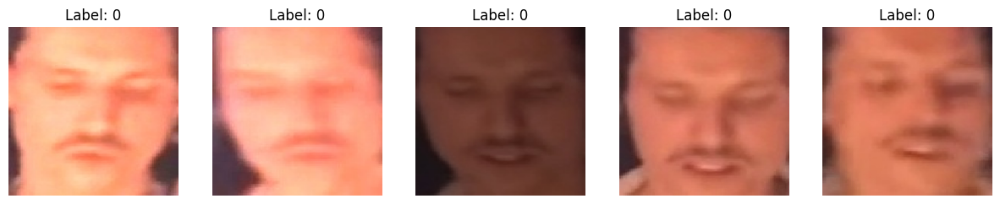

25/25 [==============================] - 34s 980ms/step - loss: 0.0821 - accuracy: 0.0000e+00 - val_loss: 0.2516 - val_accuracy: 0.0000e+00
Epoch 2/10
Norma L2 dei gradienti al batch 0: [0.055100042, 2.7081496e-08, 0.021621551, 0.052503977]
25/25 [==============================] - ETA: 0s - loss: 0.0097 - accuracy: 0.0487Finita l'epoca 2


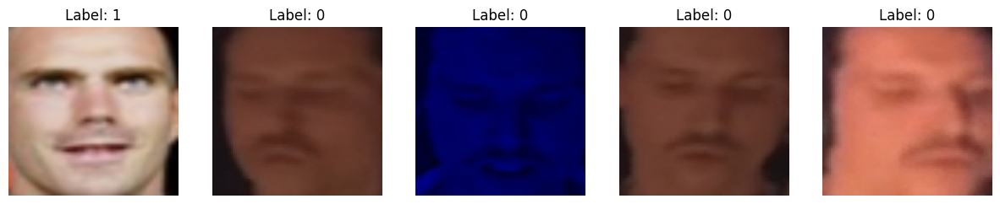

25/25 [==============================] - 22s 864ms/step - loss: 0.0095 - accuracy: 0.0487 - val_loss: 0.0799 - val_accuracy: 0.0000e+00
Epoch 3/10
Norma L2 dei gradienti al batch 0: [0.003658142, 3.1145453e-09, 0.0029251638, 0.0072824256]
25/25 [==============================] - ETA: 0s - loss: 5.4583e-05 - accuracy: 0.9456Finita l'epoca 3


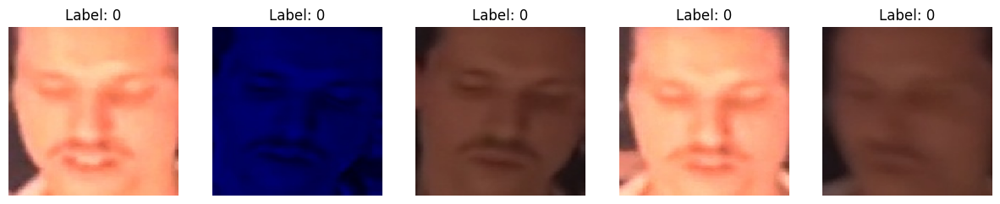

25/25 [==============================] - 23s 916ms/step - loss: 5.3491e-05 - accuracy: 0.9456 - val_loss: 0.0153 - val_accuracy: 0.0000e+00
Epoch 4/10
Norma L2 dei gradienti al batch 0: [0.0, 0.0, 0.0, 0.0]
25/25 [==============================] - ETA: 0s - loss: 2.9850e-06 - accuracy: 0.9962Finita l'epoca 4


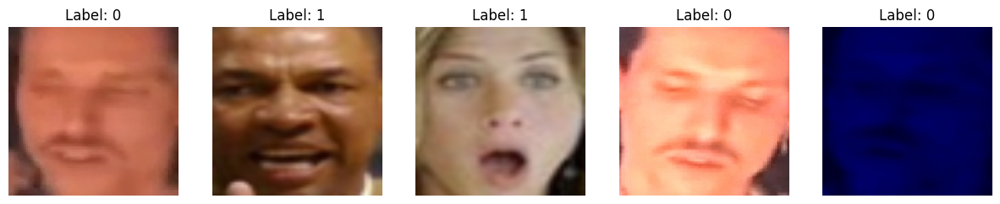

25/25 [==============================] - 21s 855ms/step - loss: 2.9253e-06 - accuracy: 0.9962 - val_loss: 1.8147e-05 - val_accuracy: 0.9799
Epoch 5/10
Norma L2 dei gradienti al batch 0: [0.0, 0.0, 0.0, 0.0]
25/25 [==============================] - ETA: 0s - loss: 4.2061e-07 - accuracy: 0.9994Finita l'epoca 5


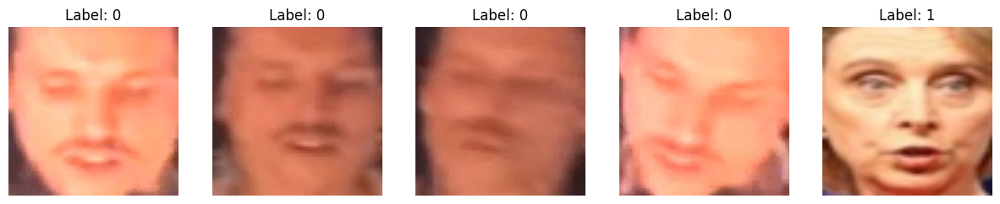

25/25 [==============================] - 21s 859ms/step - loss: 4.1219e-07 - accuracy: 0.9994 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/10
Norma L2 dei gradienti al batch 0: [0.0, 0.0, 0.0, 0.0]
25/25 [==============================] - ETA: 0s - loss: 4.4573e-07 - accuracy: 0.9987Finita l'epoca 6


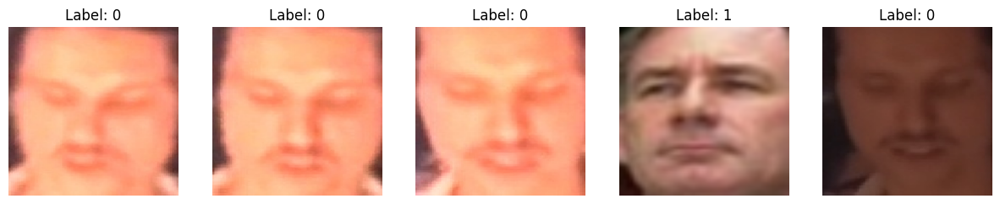

25/25 [==============================] - 20s 816ms/step - loss: 4.3682e-07 - accuracy: 0.9987 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/10
Norma L2 dei gradienti al batch 0: [0.0, 0.0, 0.0, 0.0]
25/25 [==============================] - ETA: 0s - loss: 1.0568e-06 - accuracy: 0.9981Finita l'epoca 7


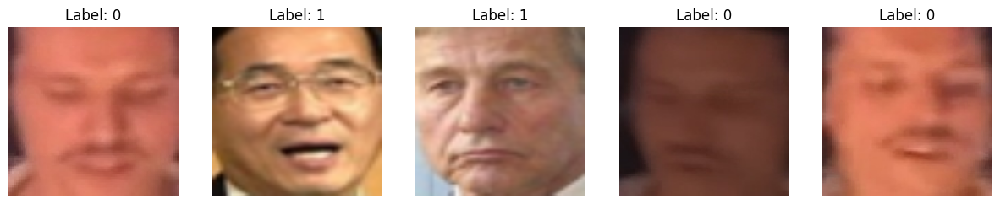

25/25 [==============================] - 22s 880ms/step - loss: 1.0356e-06 - accuracy: 0.9981 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 8/10
Norma L2 dei gradienti al batch 0: [0.0, 0.0, 0.0, 0.0]
25/25 [==============================] - ETA: 0s - loss: 3.2532e-07 - accuracy: 0.9987Finita l'epoca 8


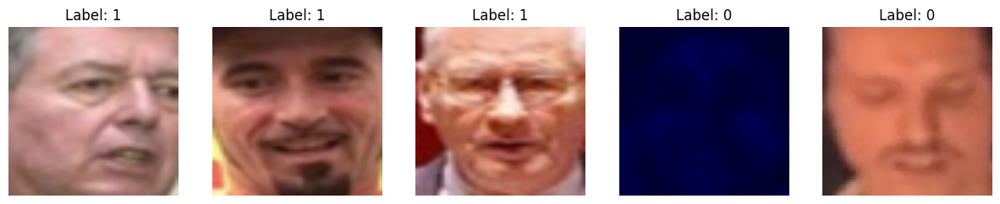

25/25 [==============================] - 20s 810ms/step - loss: 3.1881e-07 - accuracy: 0.9987 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 9/10
Norma L2 dei gradienti al batch 0: [0.0, 0.0, 0.0, 0.0]
25/25 [==============================] - ETA: 0s - loss: 4.5283e-08 - accuracy: 0.9987Finita l'epoca 9


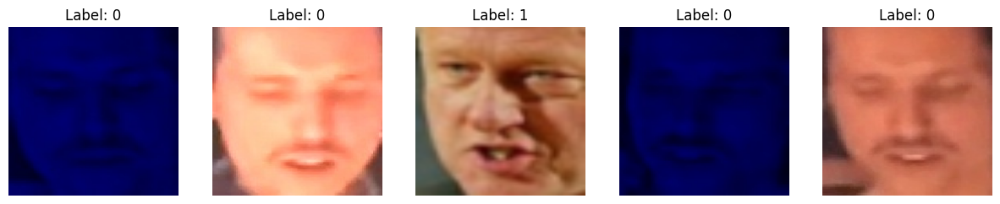

25/25 [==============================] - 20s 814ms/step - loss: 4.4378e-08 - accuracy: 0.9987 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 10/10
Norma L2 dei gradienti al batch 0: [0.0, 0.0, 0.0, 0.0]
25/25 [==============================] - ETA: 0s - loss: 0.0000e+00 - accuracy: 1.0000Finita l'epoca 10


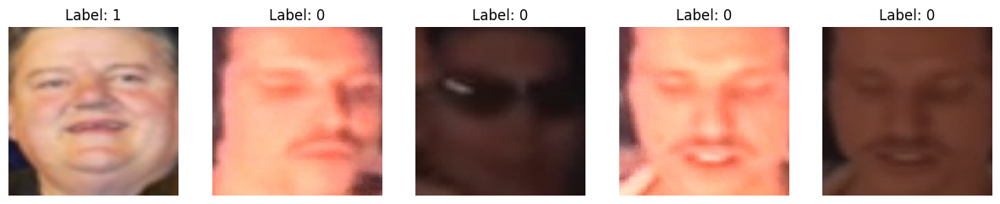

25/25 [==============================] - 20s 812ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Numero totale di epoche di addestramento completate: 10


In [ ]:
training_counter = TrainingCounter()

# Calcola la dimensione del dataset
dataset_size = len(images) + len(lfw_images)  # Usa la lunghezza degli array delle immagini
print("Dimensione totale del dataset combinato:", dataset_size)

# Calcola la dimensione dei set di addestramento e validazione
train_size = int((1 - validation_split) * dataset_size)
validation_size = int(dataset_size - train_size)

# Assicurati che ci siano abbastanza immagini per formare almeno un batch
# if train_size < batch_size or validation_size < batch_size:
#    raise ValueError("Il numero totale di immagini non è sufficiente per formare un batch. Diminuisci la dimensione del batch o aumenta il numero di immagini.")

train_dataset = combined_data.take(train_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)
validation_dataset = combined_data.skip(train_size).take(validation_size).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Calcola steps_per_epoch e validation_steps
steps_per_epoch = np.ceil(train_size / batch_size)
validation_steps = np.ceil(validation_size / batch_size)




# Compila il modello con la triplet loss e la triplet accuracy
feature_model.compile(optimizer='adam', loss=triplet_loss(alpha=0.6), metrics=[triplet_accuracy(alpha=0.6)])




# Istanziare il callback
print_random_images_callback = PrintRandomImagesCallback(train_dataset)

# Istanziare il callback per il conteggio delle epoche
training_counter = TrainingCounter()

# Callback per fermare l'addestramento se non vi sono miglioramenti
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Callback per salvare il miglior modello durante l'addestramento
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)

# Prendi un campione di dati di training e le corrispondenti etichette per il monitoraggio dei gradienti
x_train_sample, y_train_sample = next(iter(train_dataset.take(1)))

# Istanziare il callback per il monitoraggio dei gradienti
gradient_monitor = GradientMonitor(model=feature_model, x_train_sample=x_train_sample, y_train_sample=y_train_sample)

# Creazione dei callbacks per la scheda del tasso di apprendimento e gli altri meccanismi di early stopping e checkpoint
lrate = LearningRateScheduler(step_decay)
early_stopping = EarlyStopping(monitor='val_loss', patience=10)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)


# Addestramento del modello con i nuovi callback
history = feature_model.fit(
    train_dataset,
    epochs=10,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_dataset,
    validation_steps=validation_steps,
    verbose=1,
    callbacks=[early_stopping, model_checkpoint, training_counter, gradient_monitor, print_random_images_callback]
)

# Dopo l'addestramento, stampa il numero totale di epoche completate
print(f"Numero totale di epoche di addestramento completate: {training_counter.epoch_count}")

# Presumendo che usi un batch di dimensione 256 come nell'esempio originale
batch_size = 256

# Numero di batch per epoca nel set di addestramento
steps_per_epoch = train_size // batch_size

# Calcola il numero totale di immagini utilizzate per l'addestramento
total_images_used = steps_per_epoch * batch_size * training_counter.epoch_count

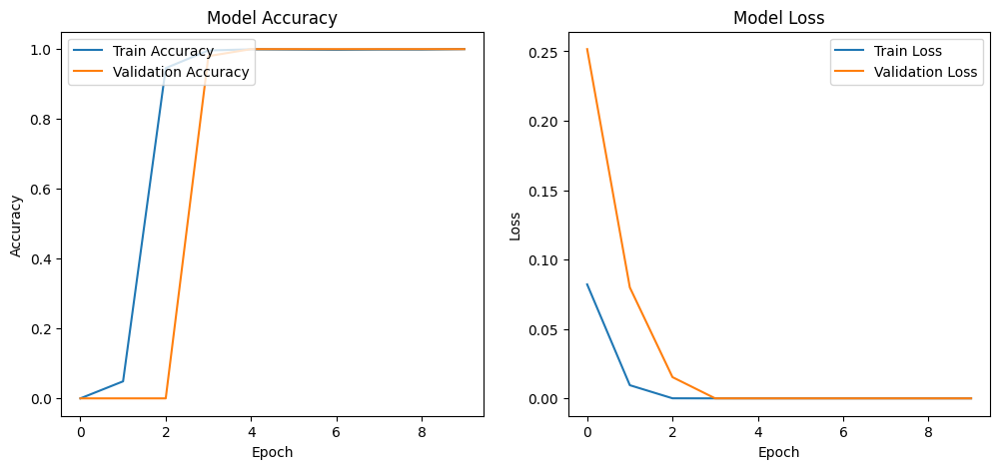

In [ ]:
import matplotlib.pyplot as plt

# Grafico dell'accuratezza
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

# Grafico della perdita
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')

plt.show()


# face_reconition

In [ ]:
!pip install dlib
!pip install numpy

import dlib
import numpy

print("dlib version:", dlib.__version__)
print("numpy version:", numpy.__version__)


dlib version: 19.24.2
numpy version: 1.25.2


In [ ]:
!pip install mtcnn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 10.1 MB/s eta 0:00:00


In [ ]:
!pip install face_recognition

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566170 sha256=907787d6ac355988cfa2531b5ad60a8d5adecce967ffcccfca4226b81f3dc416
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models


In [ ]:
from mtcnn import MTCNN
import cv2
import numpy as np
import face_recognition

# Inizializza MTCNN detector
detector = MTCNN()

# Carica l'immagine della persona da riconoscere e calcola la codifica del volto
image_of_person = face_recognition.load_image_file("/content/drive/MyDrive/Viso/Immagini/frame0.jpg")
person_face_encoding = face_recognition.face_encodings(image_of_person)[0]  # Assumiamo una sola faccia per immagine

# Apre il video di input
input_video = cv2.VideoCapture('/content/drive/MyDrive/Viso/video.mp4')
if not input_video.isOpened():
    raise IOError("Non è stato possibile aprire il video di input.")

frame_width = int(input_video.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(input_video.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = input_video.get(cv2.CAP_PROP_FPS)
size = (frame_width, frame_height)

# Definisce il codec e crea un oggetto VideoWriter
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output_video = cv2.VideoWriter('/content/drive/MyDrive/Video/Output_Registrazione_2024-02-16_220944.mp4', fourcc, fps, size)




4/4 [==============================] - 0s 6ms/step


TypeError: compute_face_descriptor(): incompatible function arguments. The following argument types are supported:
    1. (self: _dlib_pybind11.face_recognition_model_v1, img: numpy.ndarray[(rows,cols,3),numpy.uint8], face: _dlib_pybind11.full_object_detection, num_jitters: int = 0, padding: float = 0.25) -> _dlib_pybind11.vector
    2. (self: _dlib_pybind11.face_recognition_model_v1, img: numpy.ndarray[(rows,cols,3),numpy.uint8], num_jitters: int = 0) -> _dlib_pybind11.vector
    3. (self: _dlib_pybind11.face_recognition_model_v1, img: numpy.ndarray[(rows,cols,3),numpy.uint8], faces: _dlib_pybind11.full_object_detections, num_jitters: int = 0, padding: float = 0.25) -> _dlib_pybind11.vectors
    4. (self: _dlib_pybind11.face_recognition_model_v1, batch_img: List[numpy.ndarray[(rows,cols,3),numpy.uint8]], batch_faces: List[_dlib_pybind11.full_object_detections], num_jitters: int = 0, padding: float = 0.25) -> _dlib_pybind11.vectorss
    5. (self: _dlib_pybind11.face_recognition_model_v1, batch_img: List[numpy.ndarray[(rows,cols,3),numpy.uint8]], num_jitters: int = 0) -> _dlib_pybind11.vectors

Invoked with: <_dlib_pybind11.face_recognition_model_v1 object at 0x79d8c4135b30>, array([[[34, 27, 30],
        [34, 27, 30],
        [36, 26, 30],
        ...,
        [27, 24, 28],
        [27, 24, 28],
        [27, 24, 28]],

       [[35, 28, 31],
        [35, 28, 31],
        [35, 28, 31],
        ...,
        [27, 24, 28],
        [27, 24, 28],
        [27, 24, 28]],

       [[35, 28, 31],
        [35, 28, 31],
        [35, 28, 31],
        ...,
        [27, 24, 28],
        [27, 24, 28],
        [27, 24, 28]],

       ...,

       [[31, 24, 27],
        [31, 24, 27],
        [31, 24, 27],
        ...,
        [87, 50, 49],
        [86, 49, 48],
        [82, 49, 51]],

       [[33, 26, 29],
        [31, 24, 27],
        [31, 24, 27],
        ...,
        [87, 50, 49],
        [86, 49, 48],
        [83, 50, 52]],

       [[30, 25, 27],
        [30, 25, 27],
        [31, 23, 29],
        ...,
        [90, 53, 52],
        [91, 54, 53],
        [89, 54, 55]]], dtype=uint8), <_dlib_pybind11.full_object_detection object at 0x79d762139fb0>, 1

In [ ]:
frame_count = 0
while True:
    ret, frame = input_video.read()
    if not ret:
        print(f"Fine del video dopo {frame_count} frame.")
        break

    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Rileva i volti nel frame corrente utilizzando MTCNN
    faces = detector.detect_faces(rgb_frame)
    for face in faces:
        bounding_box = face['box']
        keypoints = face['keypoints']

        # Estrai la regione del volto rilevato
        face_img = rgb_frame[bounding_box[1]:bounding_box[1] + bounding_box[3], bounding_box[0]:bounding_box[0] + bounding_box[2]]
        face_encodings = face_recognition.face_encodings(face_img)

        # Procedi solo se è stata trovata almeno una codifica del volto
        if face_encodings:
            match = face_recognition.compare_faces([person_face_encoding], face_encodings[0], tolerance=0.6)
            if match[0]:  # Se trova una corrispondenza
                cv2.rectangle(frame, (bounding_box[0], bounding_box[1]), (bounding_box[0] + bounding_box[2], bounding_box[1] + bounding_box[3]), (0, 255, 0), 2)

    # Scrive il frame modificato nel video di output
    output_video.write(frame)
    frame_count += 1

# Rilascio delle risorse
input_video.release()
output_video.release()
cv2.destroyAllWindows()

face_recognition2

In [ ]:
!pip install face_recognition
!pip install opencv-python
!pip install dlib
!pip install numpy

import dlib
import numpy

print("dlib version:", dlib.__version__)
print("numpy version:", numpy.__version__)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566170 sha256=ab57d51f943bcc8290fbae1966554f543707bbeb721565c2eed66f8f92285e00
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models
dlib version: 19.24.2
numpy version: 1.25.2


In [ ]:
!pip install facenet_pytorch

import torch
from facenet_pytorch import MTCNN
import cv2
import face_recognition

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Carica il modello MTCNN senza l'argomento keep_all
mtcnn = MTCNN(device=device)

# Funzione per trovare i volti in un'immagine utilizzando MTCNN
def find_faces(image):
    # Rileva i volti nell'immagine
    boxes, _ = mtcnn.detect(image)
    return boxes


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 11.0 MB/s eta 0:00:00


ModuleNotFoundError: No module named 'face_recognition'

In [ ]:
import cv2
import numpy as np
import face_recognition
# Carica l'immagine per l'addestramento
training_image_path = '/content/drive/MyDrive/Viso/Immagini/frame0.jpg'
training_image = face_recognition.load_image_file(training_image_path)

# Codifica il volto nell'immagine di addestramento
training_face_encoding = face_recognition.face_encodings(training_image)[0]


In [ ]:
!pip install mtcnn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 9.9 MB/s eta 0:00:00


In [ ]:
import face_recognition
import os
import pickle

# Percorso alla cartella con i frame
frames_path = '/content/drive/MyDrive/Viso/Immagini/'

# Percorso dove salvare gli encoding
encoding_file_path = '/content/drive/MyDrive/Viso/EncodingFile.pkl'

# Dizionario per memorizzare gli encoding (chiave: nome del file, valore: encoding)
all_face_encodings = {}

# Carica ogni immagine dalla cartella e genera l'encoding
for frame_name in os.listdir(frames_path):
    # Costruisci il percorso completo dell'immagine
    frame_path = os.path.join(frames_path, frame_name)

    # Carica l'immagine
    image = face_recognition.load_image_file(frame_path)

    # Ottieni gli encoding dell'immagine (presumendo un solo volto per immagine)
    face_encodings = face_recognition.face_encodings(image)

    # Salva l'encoding nel dizionario se almeno un volto è stato trovato
    if face_encodings:
        all_face_encodings[frame_name] = face_encodings[0]

# Salva gli encoding in un file
with open(encoding_file_path, 'wb') as encoding_file:
    pickle.dump(all_face_encodings, encoding_file)

print(f"Salvati {len(all_face_encodings)} encoding di volti.")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Viso/Immagini/'

In [ ]:
import numpy as np

# Assicurati di avere almeno un encoding, altrimenti la mediana non ha senso
if len(all_face_encodings) > 0:
    # Limita a 300 encoding se ce ne sono di più
    selected_encodings = list(all_face_encodings.values())[:300]

    # Calcola la mediana per ciascuna delle 128 dimensioni
    median_encoding = np.median(np.array(selected_encodings), axis=0)

    # Salva la mediana degli encoding in un file
    median_encoding_file_path = '/content/drive/MyDrive/median_encoding.pkl'
    with open(median_encoding_file_path, 'wb') as file:
        pickle.dump(median_encoding, file)

    print("Mediana degli encoding salvata.")


In [ ]:
from mtcnn.mtcnn import MTCNN
import time

# Percorso al video originale su Google Drive
video_path = '/content/drive/MyDrive/Viso/video.mp4'
video_capture = cv2.VideoCapture(video_path)

# Usa il codec 'mp4v' per il formato .mp4
fourcc = cv2.VideoWriter_fourcc(*'mp4v')

# Aggiorna il percorso di output per salvare il video in Google Drive, in formato .mp4
output_video_path = '/content/drive/MyDrive/Video/modified_video2.mp4'
out = cv2.VideoWriter(output_video_path, fourcc, 20.0, (int(video_capture.get(3)), int(video_capture.get(4))))

total_processing_time = 0
frame_count = 0

while video_capture.isOpened():
    ret, frame = video_capture.read()
    if not ret:
        break

    start_time = time.time()  # Inizia a misurare il tempo

    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Rileva i volti nel frame
    boxes, _ = mtcnn.detect(rgb_frame)

    if boxes is not None and len(boxes) > 0:
        max_area = 0
        selected_box = None
        for box in boxes:
            top, right, bottom, left = int(box[1]), int(box[2]), int(box[3]), int(box[0])
            area = (bottom - top) * (right - left)
            if area > max_area:
                max_area = area
                selected_box = box

        if selected_box is not None:
            top, right, bottom, left = int(selected_box[1]), int(selected_box[2]), int(selected_box[3]), int(selected_box[0])
            top = max(top, 0)
            right = min(right, rgb_frame.shape[1])
            bottom = min(bottom, rgb_frame.shape[0])
            left = max(left, 0)

            face_encodings = face_recognition.face_encodings(rgb_frame, [(top, right, bottom, left)])
            if face_encodings:
                face_encoding = face_encodings[0]
                matches = face_recognition.compare_faces([training_face_encoding], face_encoding)
                if True in matches:
                    cv2.rectangle(frame, (left, top), (right, bottom), (0, 0, 255), 2)

    end_time = time.time()  # Fine misurazione del tempo
    processing_time = end_time - start_time
    total_processing_time += processing_time
    frame_count += 1

    print(f"Tempo di elaborazione per il frame {frame_count}: {processing_time:.4f} secondi.")

    out.write(frame)

# Mostra il tempo di elaborazione medio per frame
if frame_count > 0:
    print(f"Tempo di elaborazione medio per frame: {total_processing_time / frame_count:.4f} secondi.")

video_capture.release()
out.release()


Tempo di elaborazione per il frame 1: 0.2978 secondi.
Tempo di elaborazione per il frame 2: 0.2971 secondi.
Tempo di elaborazione per il frame 3: 0.2428 secondi.
Tempo di elaborazione per il frame 4: 0.1832 secondi.
Tempo di elaborazione per il frame 5: 0.1867 secondi.
Tempo di elaborazione per il frame 6: 0.1781 secondi.
Tempo di elaborazione per il frame 7: 0.1823 secondi.
Tempo di elaborazione per il frame 8: 0.2264 secondi.
Tempo di elaborazione per il frame 9: 0.1807 secondi.
Tempo di elaborazione per il frame 10: 0.1984 secondi.
Tempo di elaborazione per il frame 11: 0.1766 secondi.
Tempo di elaborazione per il frame 12: 0.1855 secondi.
Tempo di elaborazione per il frame 13: 0.2067 secondi.
Tempo di elaborazione per il frame 14: 0.1863 secondi.
Tempo di elaborazione per il frame 15: 0.1990 secondi.
Tempo di elaborazione per il frame 16: 0.1811 secondi.
Tempo di elaborazione per il frame 17: 0.1765 secondi.
Tempo di elaborazione per il frame 18: 0.1877 secondi.
Tempo di elaborazio

KeyboardInterrupt: 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Definisci il path di salvataggio del video
output_video_path = '/content/drive/MyDrive/Video/noel_video.mp4'  # Cambia l'estensione in .mp4

# Configura il writer di video di OpenCV per salvare il video in formato MP4
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Cambia il codec in 'mp4v' per MP4
out = cv2.VideoWriter(output_video_path, fourcc, 20.0, (640,480))  # Assicurati che la dimensione (640,480) corrisponda alla dimensione dei tuoi frame

# Il tuo codice per il processing del video qui...

# Ricorda di rilasciare il video di input e output alla fine
video_capture.release()
out.release()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Assicurati che il percorso di output sia corretto
output_video_path = '/content/drive/MyDrive/Video/video_face_recognition1.avi'

# Preparazione del video di output con il percorso corretto
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(output_video_path, fourcc, 20.0, (int(video_capture.get(3)), int(video_capture.get(4))))

In [ ]:
# Definisci il percorso del file sorgente e il percorso di destinazione
source_path = '/mnt/data/modified_video.avi'
destination_path = '/content/drive/MyDrive/Video/modified_video.avi'

# Usa il comando shell per spostare il file
!cp "{source_path}" "{destination_path}"

cp: cannot stat '/mnt/data/modified_video.avi': No such file or directory


In [ ]:
!ffmpeg -i /mnt/data/modified_video.avi -vcodec libx264 /mnt/data/modified_video.mp4 -y


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

# Leggi il video convertito
video_path = '/mnt/data/modified_video.mp4'
mp4 = open(video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

# Crea e visualizza un elemento video HTML che riproduce il video
HTML("""
<video width=400 controls>
    <source src="%s" type="video/mp4">
</video>
""" % data_url)


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/modified_video.mp4'

In [ ]:
output_video_path = '/content/drive/MyDrive/Video/video_face_recognition1.avi'


In [ ]:
from google.colab import files
files.download('/mnt/data/modified_video.avi')
